In [ ]:
##Assam_Precipitation

In [ ]:
##best code  for pytahn is  belowAssam_Y_Precipitation_CHIRPS


2020 - Processing bands 0 to 3
2020 - June: min=170.82, max=1034.14


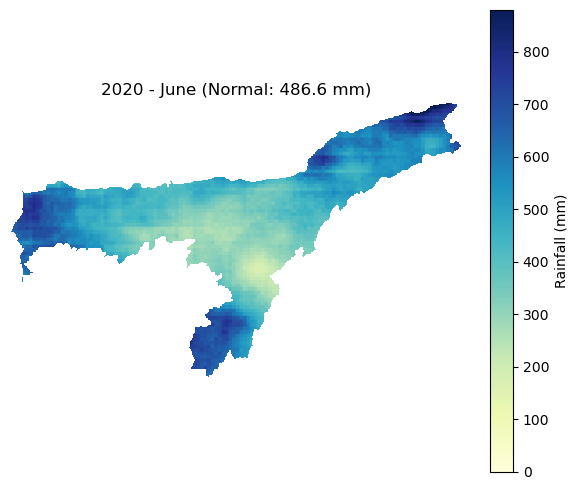

2020 - July: min=161.76, max=1116.94


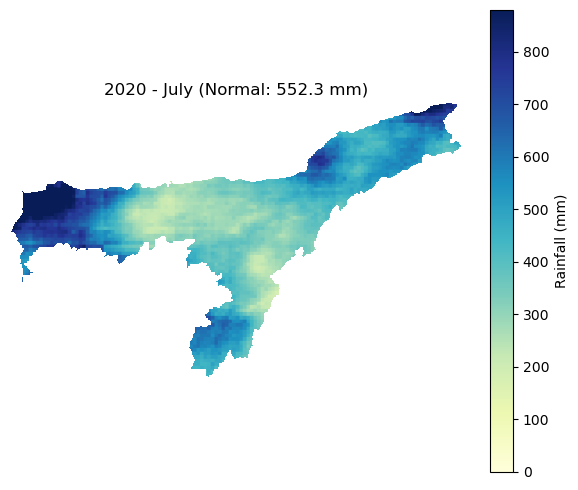

2020 - August: min=96.50, max=573.16


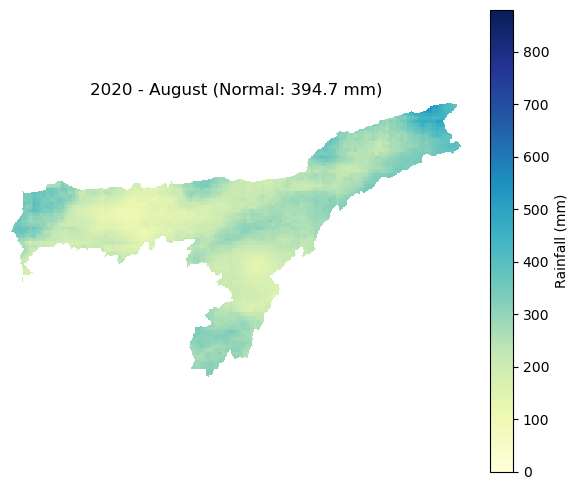

2020 - September: min=139.51, max=1274.04


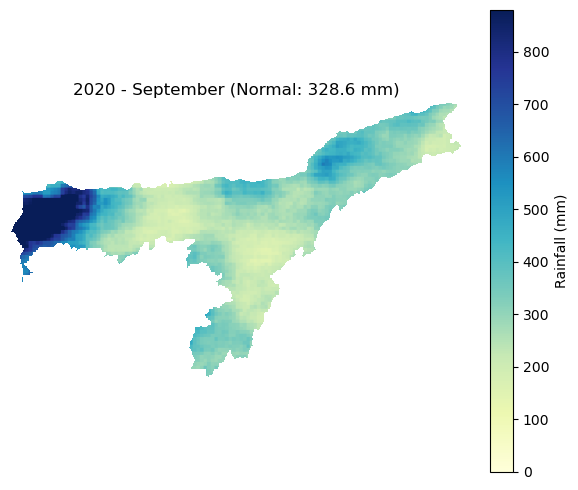

2020 - Total Rainfall (Assam only): min=687.19 mm, max=3298.89 mm


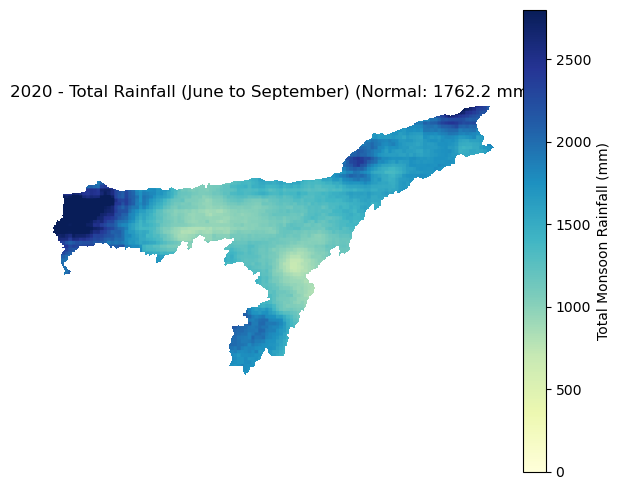


2021 - Processing bands 5 to 8
2021 - June: min=159.70, max=879.14


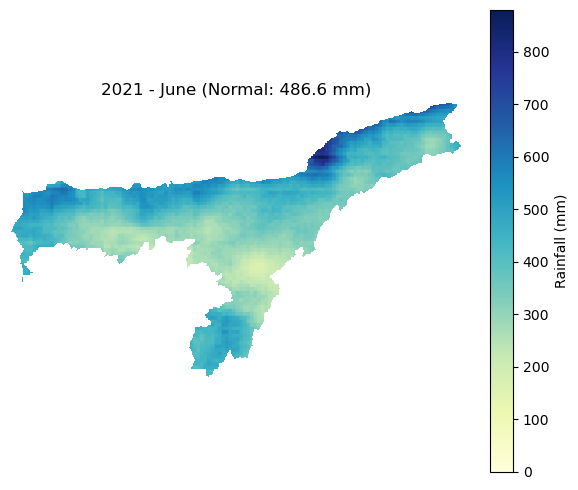

2021 - July: min=139.88, max=716.81


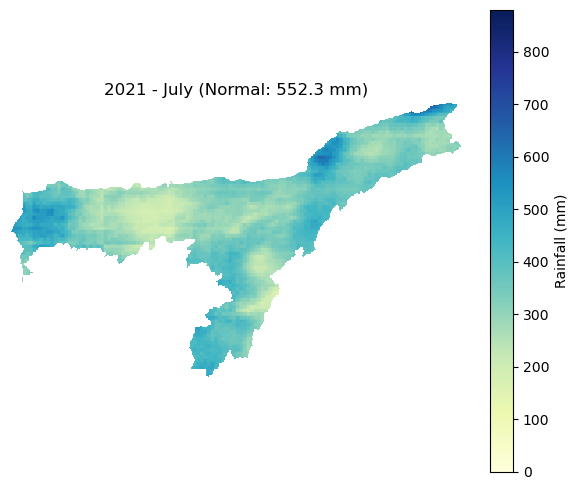

2021 - August: min=82.61, max=933.72


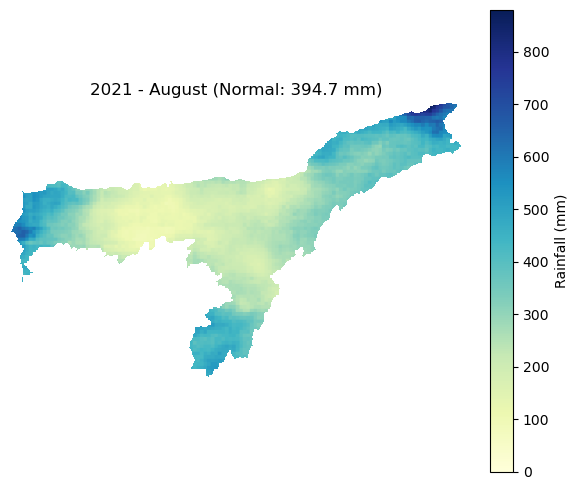

2021 - September: min=119.61, max=434.13


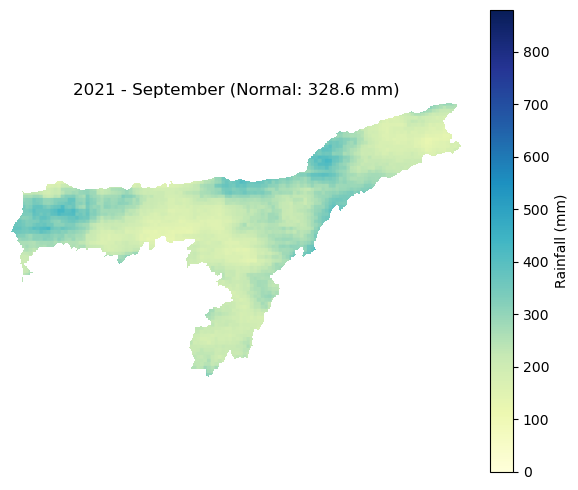

2021 - Total Rainfall (Assam only): min=693.58 mm, max=2660.48 mm


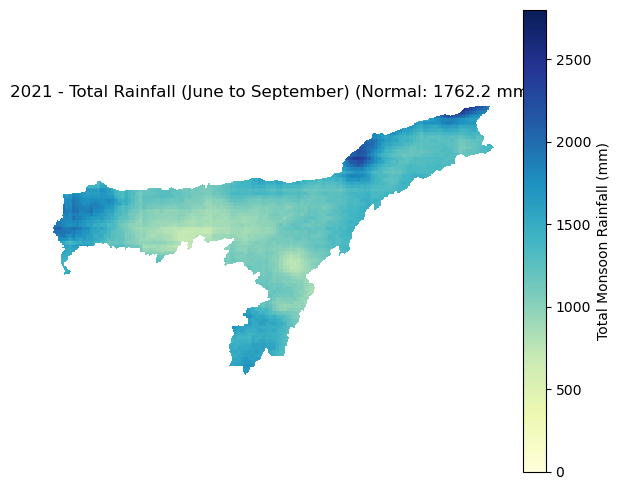


2022 - Processing bands 10 to 13
2022 - June: min=195.59, max=1120.67


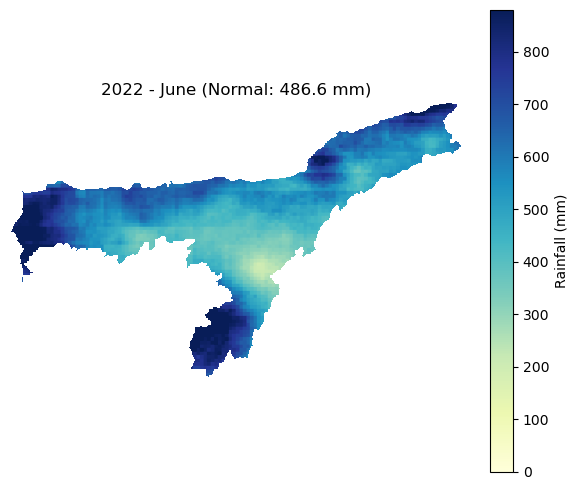

2022 - July: min=151.34, max=600.44


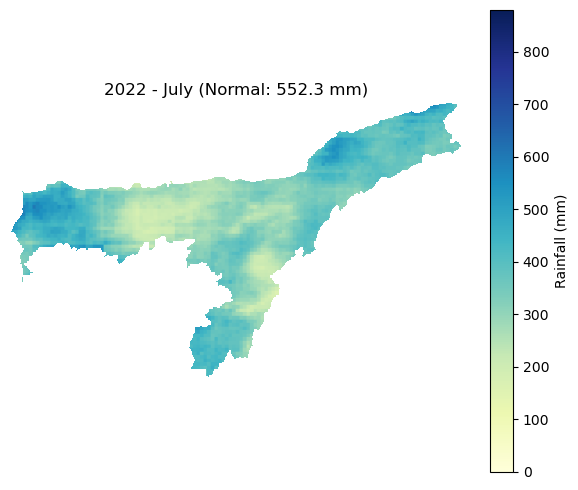

2022 - August: min=97.81, max=555.34


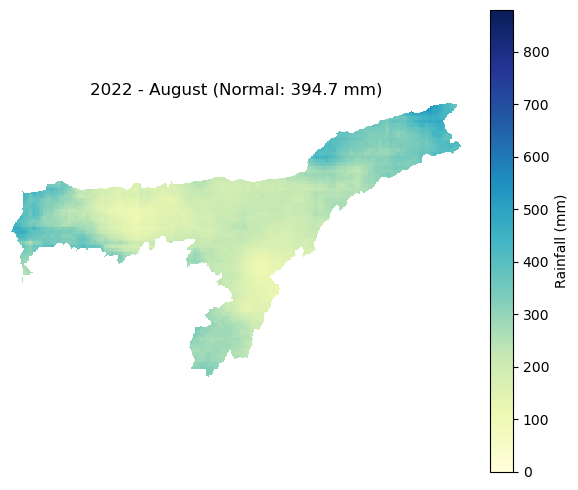

2022 - September: min=87.71, max=594.88


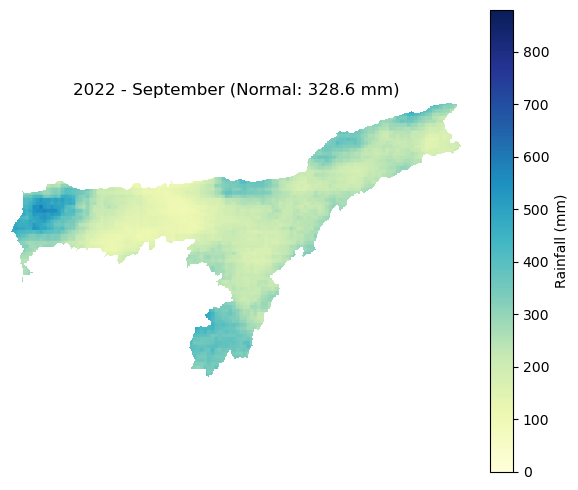

2022 - Total Rainfall (Assam only): min=677.91 mm, max=2620.96 mm


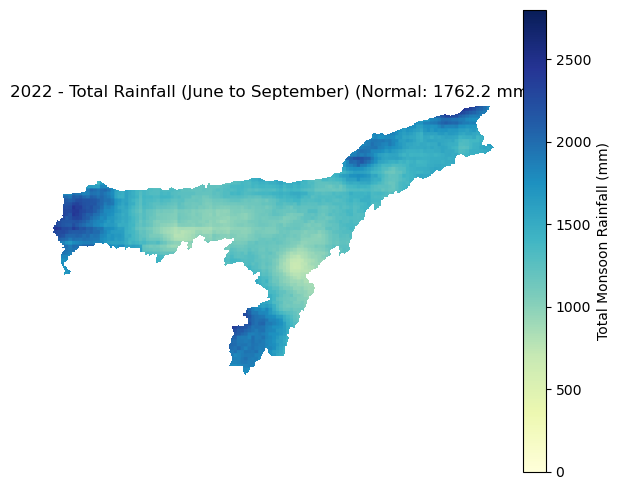


2023 - Processing bands 15 to 18
2023 - June: min=231.58, max=850.88


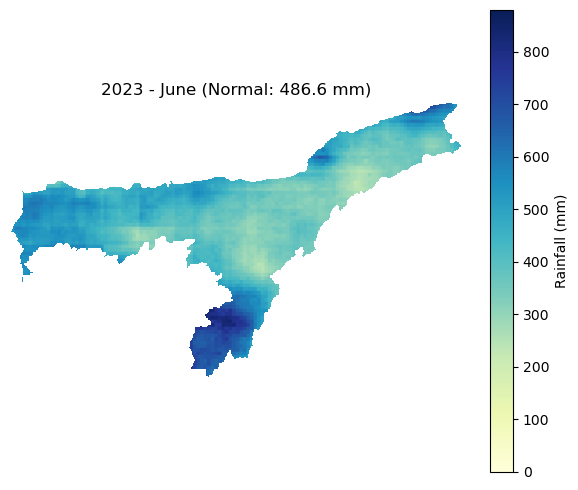

2023 - July: min=112.19, max=826.82


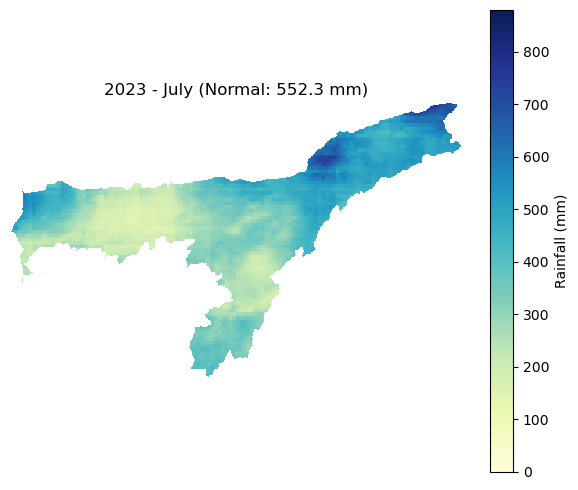

2023 - August: min=169.99, max=717.47


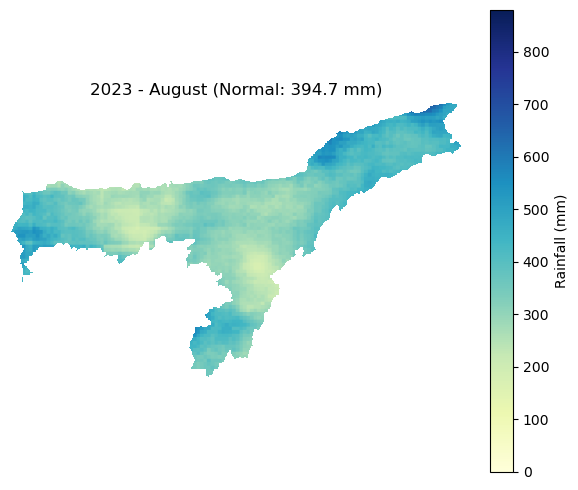

2023 - September: min=80.33, max=437.63


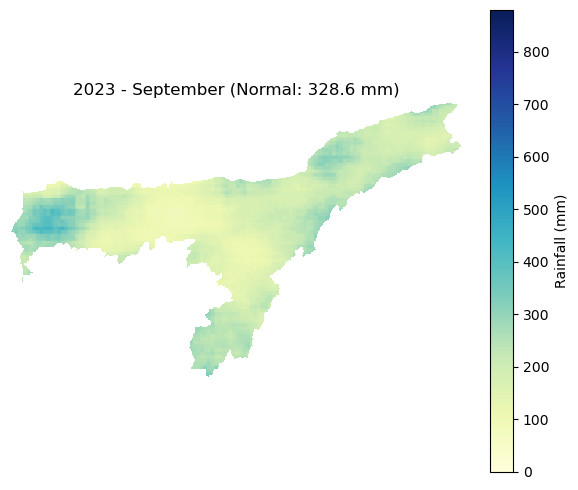

2023 - Total Rainfall (Assam only): min=730.21 mm, max=2533.57 mm


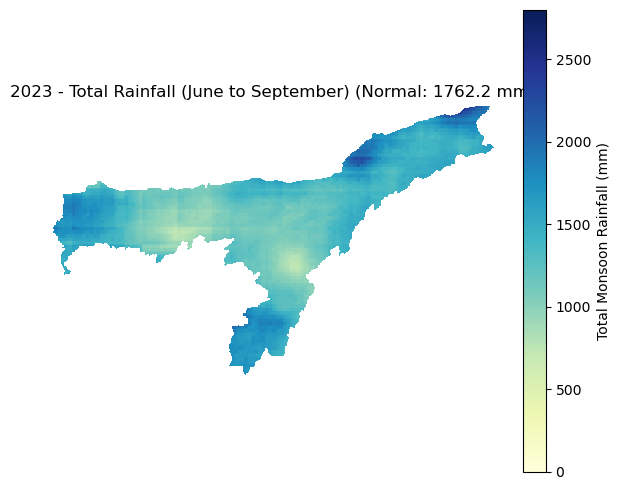


2024 - Processing bands 20 to 23
2024 - June: min=253.64, max=1117.99


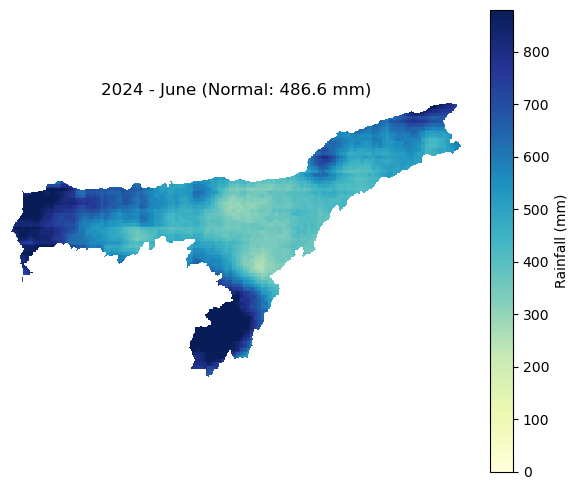

2024 - July: min=149.78, max=841.95


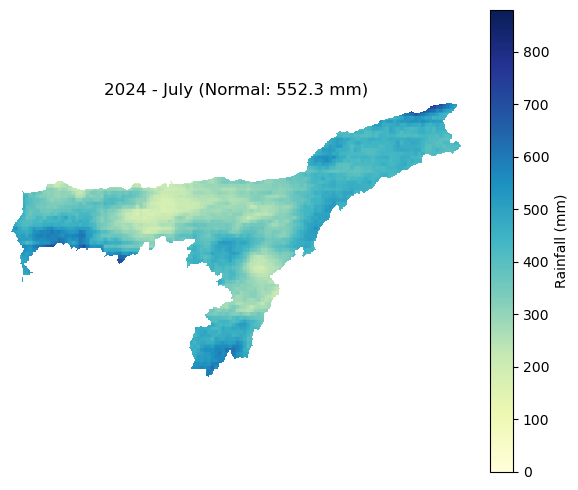

2024 - August: min=109.25, max=871.37


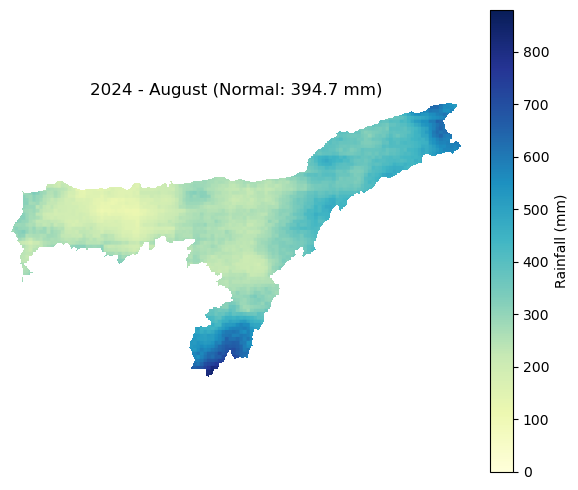

2024 - September: min=77.60, max=516.16


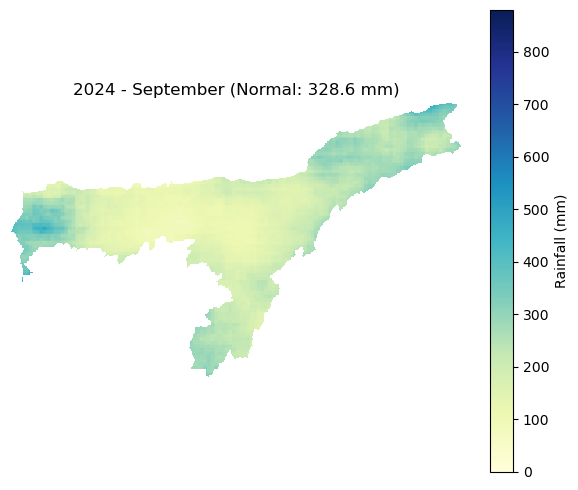

2024 - Total Rainfall (Assam only): min=826.88 mm, max=2827.27 mm


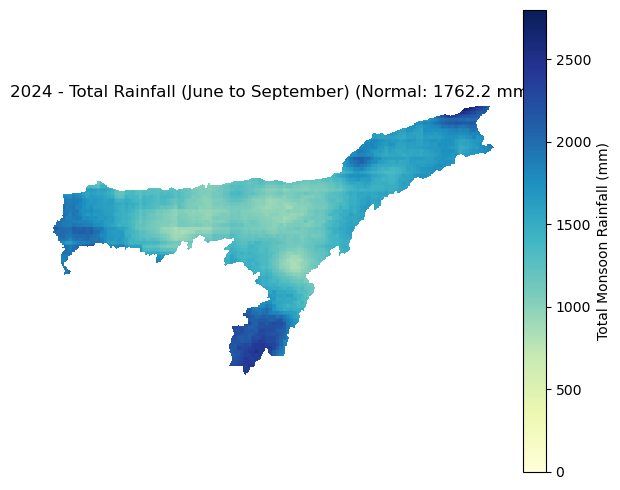

In [89]:

import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import os

# --- Configuration ---
tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"  # Corrected shapefile path
years = [2020, 2021, 2022, 2023, 2024]
band_names = ['June', 'July', 'August', 'September']
normal = [486.6, 552.3, 394.7, 328.6]
total_normal = 1762.2
monthly_vmin, monthly_vmax = 0, 880
total_vmin, total_vmax = 0, 2800
bands_per_year = 5

# --- Load Assam boundary ---
gdf = gpd.read_file(shapefile_path)
assam_geom = gdf[gdf["NAME_1"] == "Assam"].geometry.values[0]
geojson_geom = [assam_geom.__geo_interface__]

# --- Load raster ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

    needs_scaling = np.nanmax(all_bands) > 2000

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        print(f"\n{year} - Processing bands {start_band} to {start_band+3}")

        # --- Plot each monsoon month ---
        for i in range(4):
            band = monsoon_bands[i]
            print(f"{year} - {band_names[i]}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}")

            plt.figure(figsize=(6, 5))
            plt.imshow(band, cmap='YlGnBu', vmin=monthly_vmin, vmax=monthly_vmax)
            plt.colorbar(label='Rainfall (mm)')
            plt.title(f"{year} - {band_names[i]} (Normal: {normal[i]} mm)")
            plt.axis('off')
            plt.tight_layout()
            plt.show()

        # --- Compute total rainfall ---
        if needs_scaling:
            monsoon_bands = monsoon_bands * 1
        total_precip = np.nansum(monsoon_bands, axis=0)

        # --- Mask total_precip with Assam boundary using same shape ---
        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff',
                              height=total_precip.shape[0],
                              width=total_precip.shape[1],
                              count=1,
                              dtype='float32',
                              transform=transform,
                              crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)

                # Proper masking: no cropping, mask outside Assam as NaN
                total_precip_masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                total_precip_masked = total_precip_masked[0]
                # Optional: set 0s to NaN to avoid artificial min
                total_precip_masked[total_precip_masked == 0] = np.nan


        # --- Plot masked total rainfall ---
        total_min, total_max = np.nanmin(total_precip_masked), np.nanmax(total_precip_masked)
        print(f"{year} - Total Rainfall (Assam only): min={total_min:.2f} mm, max={total_max:.2f} mm")

        plt.figure(figsize=(6, 5))
        plt.imshow(total_precip_masked, cmap='YlGnBu', vmin=total_vmin, vmax=total_vmax)
        plt.colorbar(label='Total Monsoon Rainfall (mm)')
        plt.title(f"{year} - Total Rainfall (June to September) (Normal: {total_normal} mm)")
        plt.axis('off')
        plt.tight_layout()
        plt.show()


In [ ]:
##csv code

In [19]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import pandas as pd
import os

# --- Configuration for Assam ---
tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"
years = [2020, 2021, 2022, 2023, 2024]
band_names = ['June', 'July', 'August', 'September']
normal = [486.6, 552.3, 394.7, 328.6]
total_normal = 1762.2
bands_per_year = 5  # 4 monsoon months + 1 extra

# --- Load Assam geometry ---
gdf = gpd.read_file(shapefile_path)
assam_geom = gdf[gdf["NAME_1"] == "Assam"].geometry.values[0]
geojson_geom = [assam_geom.__geo_interface__]

# --- Load Raster ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

all_records = []  # For accumulating CSV entries

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    transform = src.transform
    crs = src.crs
    needs_scaling = np.nanmax(all_bands) > 2000

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        # --- Classify each month ---
        for i in range(4):
            band = monsoon_bands[i]
            rows, cols = np.where(~np.isnan(band))
            for r, c in zip(rows, cols):
                rainfall = band[r, c]
                x, y = rasterio.transform.xy(transform, r, c)
                normal_val = normal[i]

                # --- Categorize ---
                if rainfall == 0:
                    cat = "NA"
                elif rainfall > 1.6 * normal_val:
                    cat = "Large Excess"
                elif rainfall > 1.2 * normal_val:
                    cat = "Excess"
                elif rainfall >= 0.8 * normal_val:
                    cat = "Normal"
                elif rainfall >= 0.4 * normal_val:
                    cat = "Deficit"
                else:
                    cat = "Scarcity"

                all_records.append({
                    "Year": year,
                    "Month": band_names[i],
                    "Rainfall_mm": rainfall,
                    "Latitude": y,
                    "Longitude": x,
                    "Category": cat
                })

        # --- Total Monsoon ---
        if needs_scaling:
            monsoon_bands *= 1

        total_precip = np.nansum(monsoon_bands, axis=0)

        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff', height=total_precip.shape[0], width=total_precip.shape[1],
                              count=1, dtype='float32', transform=transform, crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)
                masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                masked = masked[0]
                masked[masked == 0] = np.nan

        rows, cols = np.where(~np.isnan(masked))
        for r, c in zip(rows, cols):
            rainfall = masked[r, c]
            x, y = rasterio.transform.xy(transform, r, c)

            if rainfall == 0:
                cat = "NA"
            elif rainfall > 1.6 * total_normal:
                cat = "Large Excess"
            elif rainfall > 1.2 * total_normal:
                cat = "Excess"
            elif rainfall >= 0.8 * total_normal:
                cat = "Normal"
            elif rainfall >= 0.4 * total_normal:
                cat = "Deficit"
            else:
                cat = "Scarcity"

            all_records.append({
                "Year": year,
                "Month": "Total",
                "Rainfall_mm": rainfall,
                "Latitude": y,
                "Longitude": x,
                "Category": cat
            })

# --- Save to CSV ---import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import pandas as pd
import os

# --- Configuration for Assam ---
tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"
years = [2020, 2021, 2022, 2023, 2024]
band_names = ['June', 'July', 'August', 'September']
normal = [486.6, 552.3, 394.7, 328.6]
total_normal = 1762.2
bands_per_year = 5  # 4 monsoon months + 1 extra

# --- Load Assam geometry ---
gdf = gpd.read_file(shapefile_path)
assam_geom = gdf[gdf["NAME_1"] == "Assam"].geometry.values[0]
geojson_geom = [assam_geom.__geo_interface__]

# --- Load Raster ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

all_records = []  # For accumulating CSV entries

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    transform = src.transform
    crs = src.crs
    needs_scaling = np.nanmax(all_bands) > 2000

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        # --- Classify each month ---
        for i in range(4):
            band = monsoon_bands[i]
            rows, cols = np.where(~np.isnan(band))
            for r, c in zip(rows, cols):
                rainfall = band[r, c]
                x, y = rasterio.transform.xy(transform, r, c)
                normal_val = normal[i]

                # --- Categorize ---
                if rainfall == 0:
                    cat = "NA"
                elif rainfall > 1.6 * normal_val:
                    cat = "Large Excess"
                elif rainfall > 1.2 * normal_val:
                    cat = "Excess"
                elif rainfall >= 0.8 * normal_val:
                    cat = "Normal"
                elif rainfall >= 0.4 * normal_val:
                    cat = "Deficit"
                else:
                    cat = "Scarcity"

                all_records.append({
                    "Year": year,
                    "Month": band_names[i],
                    "Rainfall_mm": rainfall,
                    "Latitude": y,
                    "Longitude": x,
                    "Category": cat
                })

        # --- Total Monsoon ---
        if needs_scaling:
            monsoon_bands *= 1

        total_precip = np.nansum(monsoon_bands, axis=0)

        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff', height=total_precip.shape[0], width=total_precip.shape[1],
                              count=1, dtype='float32', transform=transform, crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)
                masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                masked = masked[0]
                masked[masked == 0] = np.nan

        rows, cols = np.where(~np.isnan(masked))
        for r, c in zip(rows, cols):
            rainfall = masked[r, c]
            x, y = rasterio.transform.xy(transform, r, c)

            if rainfall == 0:
                cat = "NA"
            elif rainfall > 1.6 * total_normal:
                cat = "Large Excess"
            elif rainfall > 1.2 * total_normal:
                cat = "Excess"
            elif rainfall >= 0.8 * total_normal:
                cat = "Normal"
            elif rainfall >= 0.4 * total_normal:
                cat = "Deficit"
            else:
                cat = "Scarcity"

            all_records.append({
                "Year": year,
                "Month": "Total",
                "Rainfall_mm": rainfall,
                "Latitude": y,
                "Longitude": x,
                "Category": cat
            })

# --- Save to CSV ---
df = pd.DataFrame(all_records)
df.to_csv("Assam_Y_Precipitation_GT.csv", index=False)
print("✅ CSV saved: Assam_Y_Precipitation_GT.csv")

df = pd.DataFrame(all_records)
df.to_csv("Assam_Y_Precipitation_GT.csv", index=False)
print("✅ CSV saved: Assam_Y_Precipitation_GT.csv")


✅ CSV saved: Assam_Y_Precipitation_GT.csv
✅ CSV saved: Assam_Y_Precipitation_GT.csv


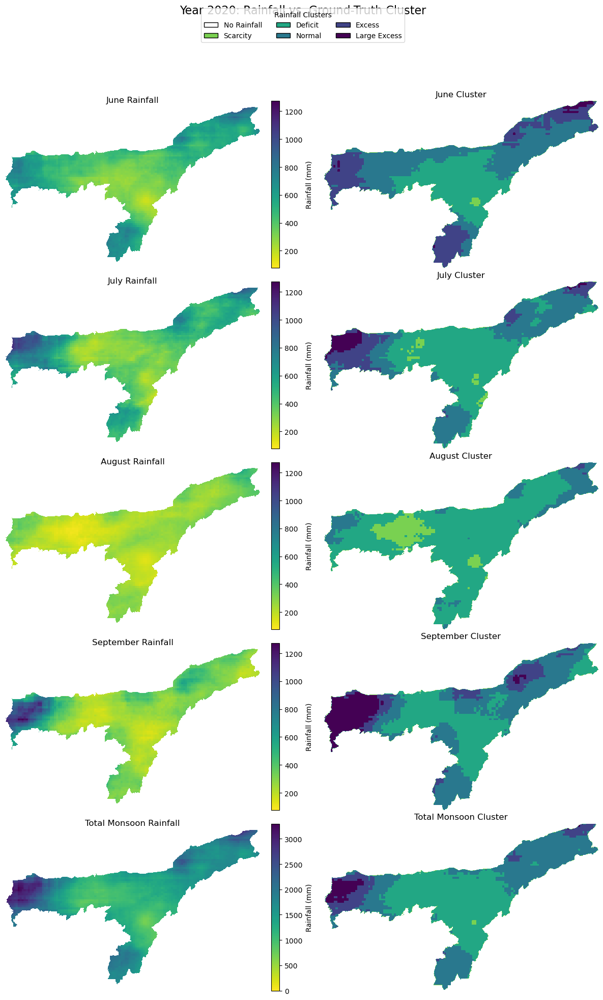

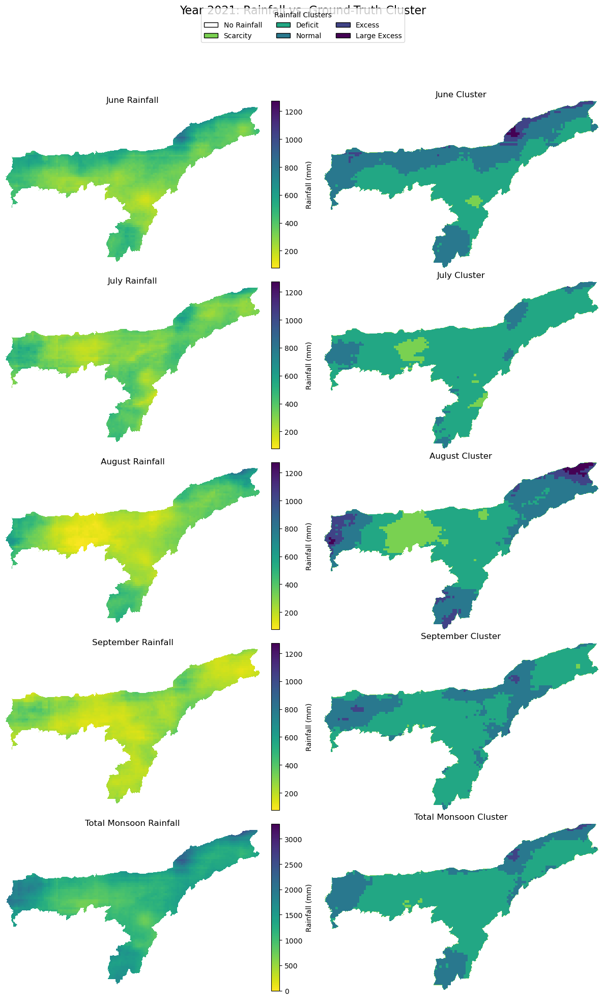

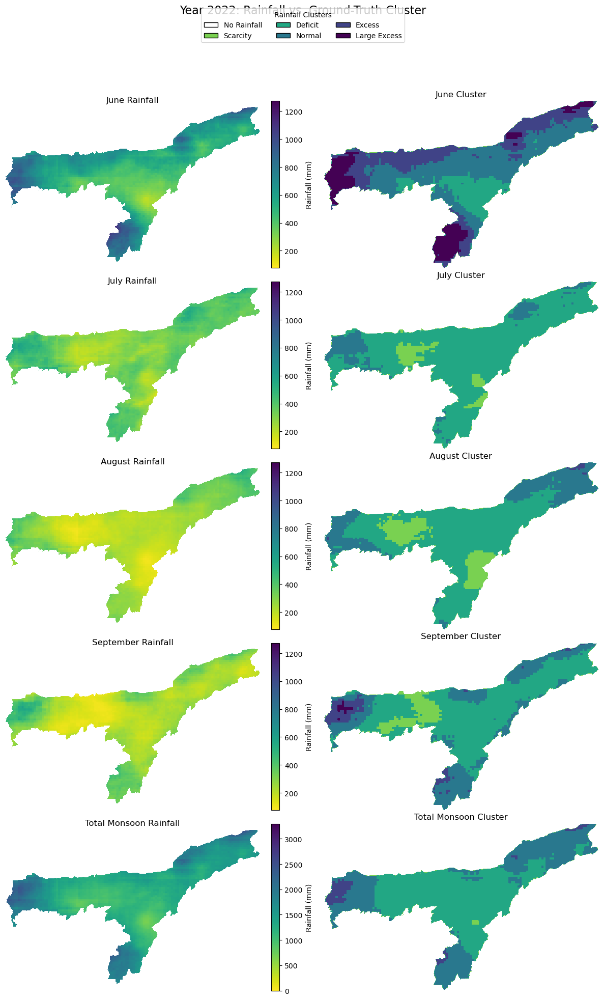

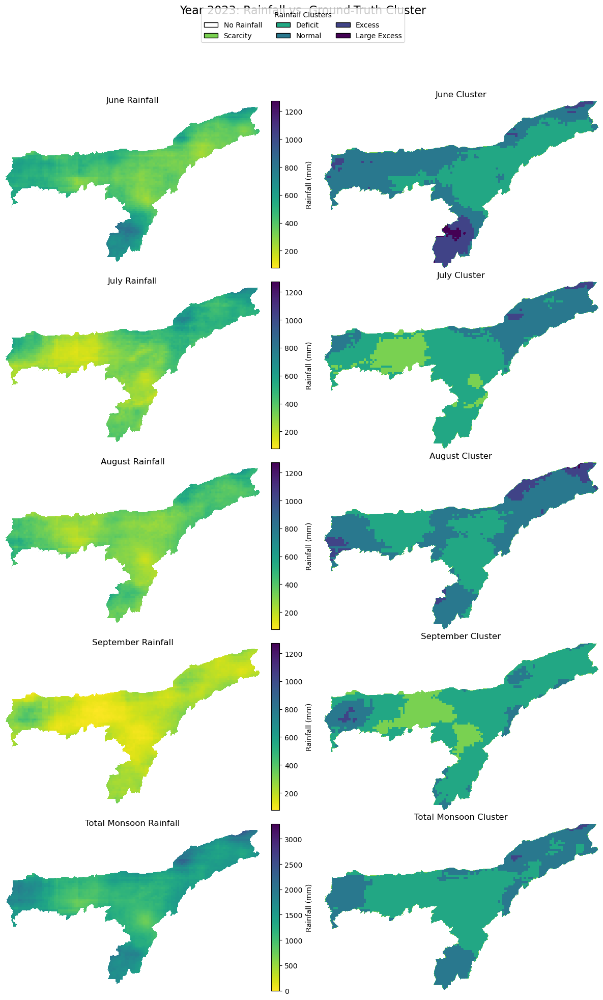

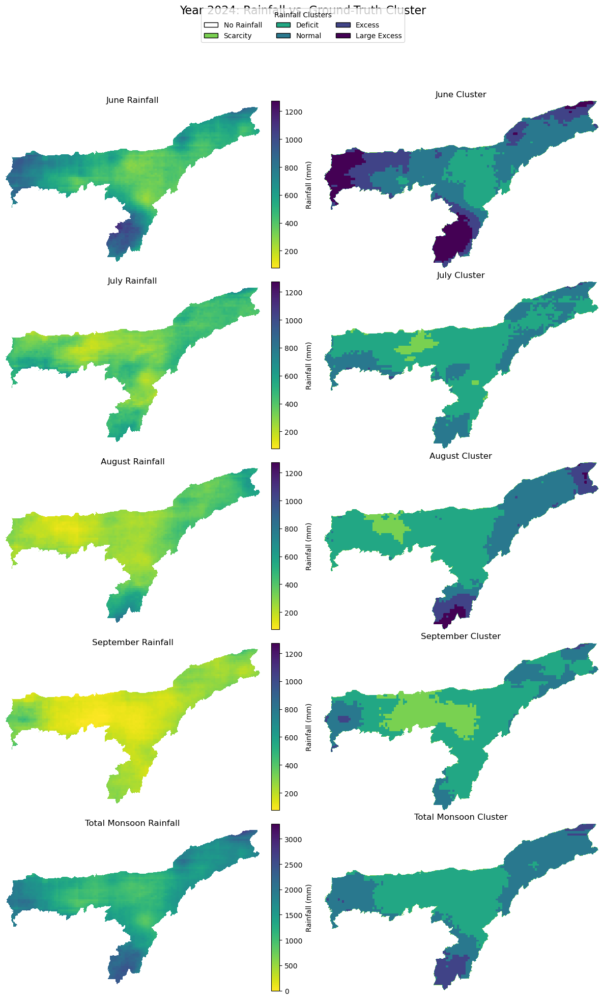

In [13]:
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if necessary)
# -----------------------------------------------------------------------------
tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"
csv_path  = "Assam_Y_Precipitation_GT.csv"

# -----------------------------------------------------------------------------
# 2) LOAD THE CSV (must contain columns: Year, Month, Latitude, Longitude, Category)
# -----------------------------------------------------------------------------
df = pd.read_csv(csv_path)

# -----------------------------------------------------------------------------
# 3) OPEN THE MULTI‐BAND TIFF
# -----------------------------------------------------------------------------
with rasterio.open(tiff_path) as src:
    all_bands = src.read()              # shape: (total_bands, rows, cols)
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

# -----------------------------------------------------------------------------
# 4) CONFIGURATION
# -----------------------------------------------------------------------------
start_year      = 2020
bands_per_year  = 5   # (4 months + 1 “Total” band) each year
month_to_index  = {
    "June":      0,
    "July":      1,
    "August":    2,
    "September": 3,
    "Total":     4
}
band_names      = ['June', 'July', 'August', 'September']
# (we’ll treat “Total” as index 4 in our cluster array)

# -----------------------------------------------------------------------------
# 5) CALCULATE vmin/vmax for RAINFALL (monthly & total) across the entire TIFF
# -----------------------------------------------------------------------------
# 5a) Monthly vmin/vmax: the first 4×5 = 20 bands are actual months (June→Sept) for each of 5 years
monthly_stack_all = []
for yidx in range(5):
    base = yidx * bands_per_year
    # take bands [base..base+3] → these are June..Sept for that year
    monthly_stack_all.append(all_bands[base:base+4].astype(np.float32))
monthly_stack_all = np.concatenate(monthly_stack_all, axis=0)  # shape: (20, H, W)
vmin_month = np.nanmin(monthly_stack_all)
vmax_month = np.nanmax(monthly_stack_all)

# 5b) Total‐monsoon vmin/vmax: sum each block of 4 bands → 5 “total” images
total_list = []
for yidx in range(5):
    base = yidx * bands_per_year
    this4 = all_bands[base:base+4].astype(np.float32)
    total_list.append(np.nansum(this4, axis=0))   # shape: (H, W)
total_stack = np.stack(total_list, axis=0)        # shape: (5, H, W)
vmin_total = np.nanmin(total_stack)
vmax_total = np.nanmax(total_stack)

# -----------------------------------------------------------------------------
# 6) BUILD A CUSTOM “CLUSTER” COLORMAP
# -----------------------------------------------------------------------------
cluster_to_id = {
    'no rainfall':  0,
    'scarcity':     1,
    'deficit':      2,
    'normal':       3,
    'excess':       4,
    'large excess': 5
}
max_cid = len(cluster_to_id) - 1  # = 5

# 6a) Base colormap for “bad” (NaN) → white; IDs 1–5 from viridis_r
base_cmap = plt.get_cmap('viridis_r')
colors = []
for cid in range(max_cid + 1):
    if cid == 0:
        colors.append('#ffffff')        # ID 0 → always white (“no rainfall” or masked)
    else:
        frac = cid / max_cid            # 1/5, 2/5, …, 5/5
        colors.append(base_cmap(frac))

cluster_cmap = ListedColormap(colors)
# Build legend handles for cluster names:
legend_handles = [
    Patch(facecolor=colors[cid], edgecolor='black', label=label.title())
    for label, cid in cluster_to_id.items()
]

# -----------------------------------------------------------------------------
# 7) FOR EACH YEAR: PLOT 5 ROWS × 2 COLUMNS → (rainfall vs. cluster)
# -----------------------------------------------------------------------------
for year_idx, year in enumerate(range(start_year, start_year + 5)):
    # 7a) Extract the four monthly rainfall bands for this year
    base = year_idx * bands_per_year
    monthly_bands = all_bands[base:base+4].astype(np.float32)

    # 7b) Compute that year’s “Total Monsoon” rainfall (sum of 4 months)
    total_precip = np.nansum(monthly_bands, axis=0)

    # 7c) Build a 5×H×W “cluster ID” array: first 4 = months, fifth = “Total”
    cluster_stack = np.zeros((5, height, width), dtype=np.uint8)

    # Fetch only the rows of df that belong to this year
    df_year = df[df['Year'] == year]

    # 7d) Fill monthly clusters (Indices 0..3)
    for idx, row in df_year.iterrows():
        m = str(row['Month']).strip()
        if m not in month_to_index:
            continue
        b = month_to_index[m]   # 0..4
        lat = float(row['Latitude'])
        lon = float(row['Longitude'])

        # Convert (lon, lat) → (row, col) in the raster
        try:
            r, c = src.index(lon, lat)
        except Exception:
            continue
        if r < 0 or r >= height or c < 0 or c >= width:
            continue

        cat_str = str(row['Category']).strip().lower()
        cid = cluster_to_id.get(cat_str, 0)
        cluster_stack[b, r, c] = cid

    # 7e) Mask any “outside‐Assam” cells in the total array → forced to NaN,
    #     so we can plot them as white: we will convert to a masked array.
    #     (If you previously stored “Total” directly in the CSV, you may skip this step.)
    #     For demonstration, assume the CSV has filtered categories only inside Assam,
    #     so any cell still equal to 0 in cluster_stack[4] can be considered “no data.”
    masked_total = np.ma.masked_where(cluster_stack[4] == 0, total_precip)

    # 7f) Create a copy of viridis_r that paints NaNs as pure white:
    rain_cmap = plt.get_cmap('viridis_r').copy()
    rain_cmap.set_bad('white')

    # 7g) Now plot:
    fig, axs = plt.subplots(5, 2, figsize=(12, 20))
    fig.suptitle(f"Year {year}: Rainfall vs. Ground‐Truth Cluster", fontsize=16)

    # -------------- Rows 0–3: June, July, August, September --------------
    for i in range(4):
        # Left: monthly rainfall (no mask outside Assam for monthly)
        im0 = axs[i, 0].imshow(
            monthly_bands[i],
            cmap='viridis_r',
            vmin=vmin_month,
            vmax=vmax_month
        )
        axs[i, 0].set_title(f"{band_names[i]} Rainfall")
        axs[i, 0].axis('off')
        plt.colorbar(im0, ax=axs[i, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

        # Right: monthly cluster
        im1 = axs[i, 1].imshow(
            cluster_stack[i],
            cmap=cluster_cmap,
            vmin=0,
            vmax=max_cid
        )
        axs[i, 1].set_title(f"{band_names[i]} Cluster")
        axs[i, 1].axis('off')

    # -------------- Row 4: Total Monsoon --------------
    # Left: masked total rainfall (NaNs → white)
    im_tot = axs[4, 0].imshow(
        masked_total,
        cmap=rain_cmap,   # colormap with bad='white'
        vmin=vmin_total,
        vmax=vmax_total
    )
    axs[4, 0].set_title("Total Monsoon Rainfall")
    axs[4, 0].axis('off')
    plt.colorbar(im_tot, ax=axs[4, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

    # Right: total cluster (IDs 0..5)
    im_clust_tot = axs[4, 1].imshow(
        cluster_stack[4],
        cmap=cluster_cmap,
        vmin=0,
        vmax=max_cid
    )
    axs[4, 1].set_title("Total Monsoon Cluster")
    axs[4, 1].axis('off')

    # -------------- Shared Legend at Top --------------
    fig.legend(
        handles=legend_handles,
        loc='upper center',
        ncol=3,
        frameon=True,
        title="Rainfall Clusters",
        bbox_to_anchor=(0.5, 0.98)
    )

    # -------------- TIGHT LAYOUT (give extra top space for title + legend) --------------
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()


In [ ]:

##Assam_GT

Categorical GeoTIFF saved as: Assam_Y_Precipitation_GT_geotif.tif


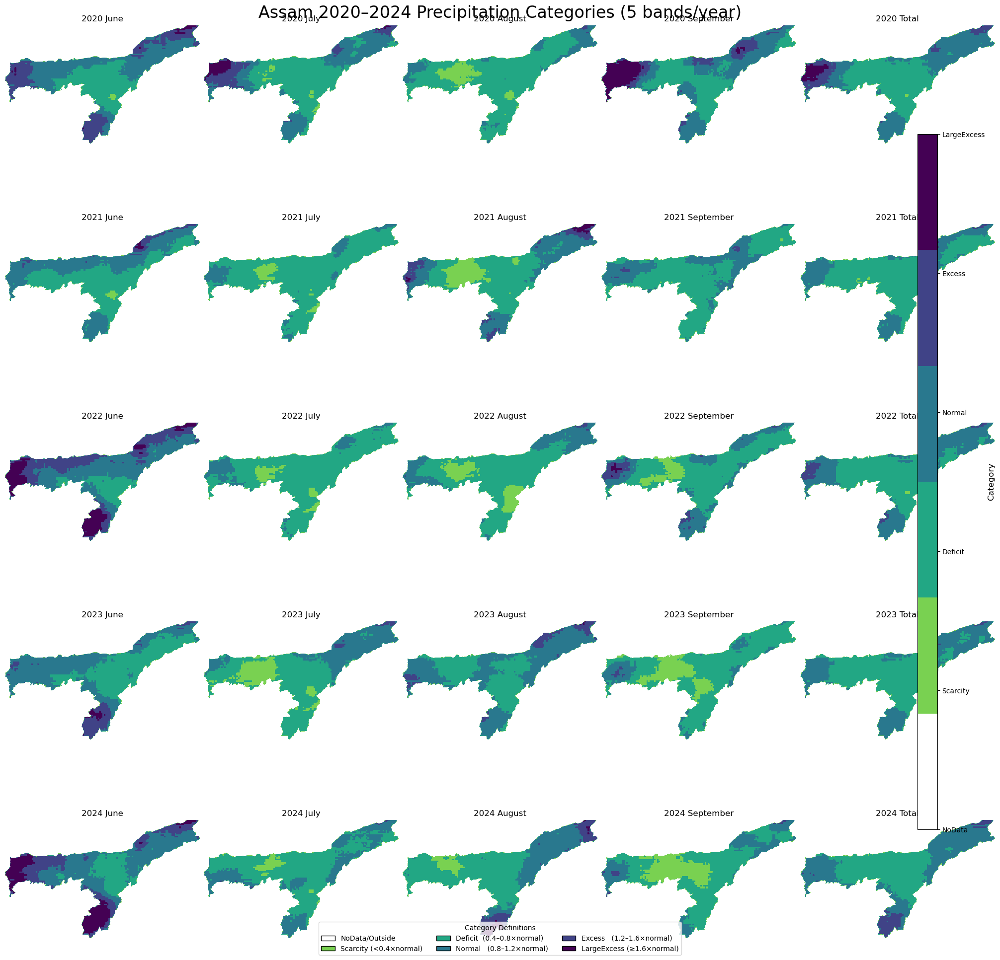

In [45]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) PATH TO YOUR 25‐BAND PRECIPITATION TIFF
# -----------------------------------------------------------------------------
tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"
if not os.path.isfile(tiff_path):
    raise FileNotFoundError(f"Cannot find {tiff_path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ ALL 25 BANDS INTO A NumPy ARRAY
# -----------------------------------------------------------------------------
with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(np.float32)  # shape = (25, H, W)
    profile   = src.profile.copy()
    height, width = src.height, src.width

n_bands = all_bands.shape[0]
if n_bands != 25:
    raise ValueError(f"Expected 25 bands (2020–2024 × 5 months), but found {n_bands}")

# -----------------------------------------------------------------------------
# 3) DEFINE “NORMAL” VALUES FOR EACH MONTH‐INDEX (0..4)
#    Index 0 = June, 1 = July, 2 = August, 3 = September, 4 = Total Monsoon
# -----------------------------------------------------------------------------
normals = np.array([
    486.6,   # June
    552.3,   # July
    394.7,   # August
    328.6,   # September
   1762.2    # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 4) CATEGORY THRESHOLDS (as MULTIPLES of “NORMAL”)
#    - Scarcity    : value < 0.4 × normal
#    - Deficit     : 0.4 ≤ value/normal < 0.8
#    - Normal      : 0.8 ≤ value/normal < 1.2
#    - Excess      : 1.2 ≤ value/normal < 1.6
#    - LargeExcess : value/normal ≥ 1.6
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array band_data and a scalar normal_value,
    returns a 2D integer array of the same shape with:
       0 → Scarcity   (value < 0.4×normal)
       1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
       2 → Normal     (0.8×normal ≤ value < 1.2×normal)
       3 → Excess     (1.2×normal ≤ value < 1.6×normal)
       4 → LargeExcess(value ≥ 1.6×normal)
      -1 → NoData / outside Assam (where original band_data is NaN)
    """
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    valid_mask = ~np.isnan(band_data)
    valid_vals = band_data[valid_mask]
    ratio = valid_vals / normal_value

    cat_vals = np.full(valid_vals.shape, -1, dtype=np.int8)
    cat_vals[np.where(ratio < 0.4)] = 0
    cat_vals[np.where((ratio >= 0.4) & (ratio < 0.8))] = 1
    cat_vals[np.where((ratio >= 0.8) & (ratio < 1.2))] = 2
    cat_vals[np.where((ratio >= 1.2) & (ratio < 1.6))] = 3
    cat_vals[np.where(ratio >= 1.6)] = 4

    cat[valid_mask] = cat_vals
    return cat

# -----------------------------------------------------------------------------
# 5) APPLY CATEGORIZATION TO ALL 25 BANDS
# -----------------------------------------------------------------------------
category_stack = np.full(all_bands.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(n_bands):
    month_index = band_idx % 5
    normal_val  = normals[month_index]
    band_data = all_bands[band_idx]  # shape = (H, W)
    category_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 6) EXPORT THE CATEGORY STACK AS A NEW 25‐BAND GeoTIFF
#    Filename: “Assam_Y_Precipitation_GT_geotif.tif”
# -----------------------------------------------------------------------------
out_profile = profile.copy()
out_profile.update({
    "count": 25,
    "dtype": rasterio.int8,
    "nodata": -1
})

output_path = "Assam_Y_Precipitation_GT_geotif.tif"
with rasterio.open(output_path, "w", **out_profile) as dst:
    dst.write(category_stack)

print(f"Categorical GeoTIFF saved as: {output_path}")

# -----------------------------------------------------------------------------
# 7) SET UP A DISCRETE COLORMAP FOR THE 5 CATEGORIES + “NoData” AS WHITE
# -----------------------------------------------------------------------------
# New color palette:
#   0 → #ffffff  (NoData)
#   1 → #79d151  (Scarcity)
#   2 → #22a784  (Deficit)
#   3 → #29788e  (Normal)
#   4 → #404387  (Excess)
#   5 → #440154  (LargeExcess)
colors = [
    "#ffffff",  # index 0: NoData
    "#79d151",  # index 1: Scarcity
    "#22a784",  # index 2: Deficit
    "#29788e",  # index 3: Normal
    "#404387",  # index 4: Excess
    "#440154"   # index 5: LargeExcess
]

cmap = ListedColormap(colors)

legend_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}

legend_handles = []
for code, text in legend_labels.items():
    color = colors[code]
    legend_handles.append(Patch(facecolor=color, edgecolor="black", label=text))

# -----------------------------------------------------------------------------
# 8) VISUALIZE ALL 25 CATEGORY LAYERS IN A 5×5 GRID
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September", "Total"]

fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20, 20), constrained_layout=True)
fig.suptitle("Assam 2020–2024 Precipitation Categories (5 bands/year)", fontsize=24, y=0.98)

for band_idx in range(n_bands):
    row = band_idx // 5
    col = band_idx % 5
    ax = axes[row, col]

    cat_layer = category_stack[band_idx]

    # Shift category codes:
    #  -1 (NoData) → 0 (white)
    #   0 (Scarcity) → 1 (#79d151)
    #   1 (Deficit)  → 2 (#22a784)
    #   2 (Normal)   → 3 (#29788e)
    #   3 (Excess)   → 4 (#404387)
    #   4 (LargeExcess)→ 5 (#440154)
    plot_array = np.full(cat_layer.shape, 0, dtype=np.int8)
    valid = cat_layer != -1
    plot_array[valid] = cat_layer[valid] + 1

    ax.imshow(plot_array, cmap=cmap, vmin=0, vmax=5)
    ax.set_title(f"{years[row]} {month_names[col]}", fontsize=12)
    ax.axis("off")

# Add a colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(
    plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=5)),
    cax=cbar_ax,
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar.ax.set_yticklabels([
    "NoData",
    "Scarcity",
    "Deficit",
    "Normal",
    "Excess",
    "LargeExcess"
])
cbar.set_label("Category", rotation=90, fontsize=12)

# Add a legend box at the bottom
fig.legend(
    handles=legend_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.02)
)

plt.show()


In [ ]:
##Assam_LST

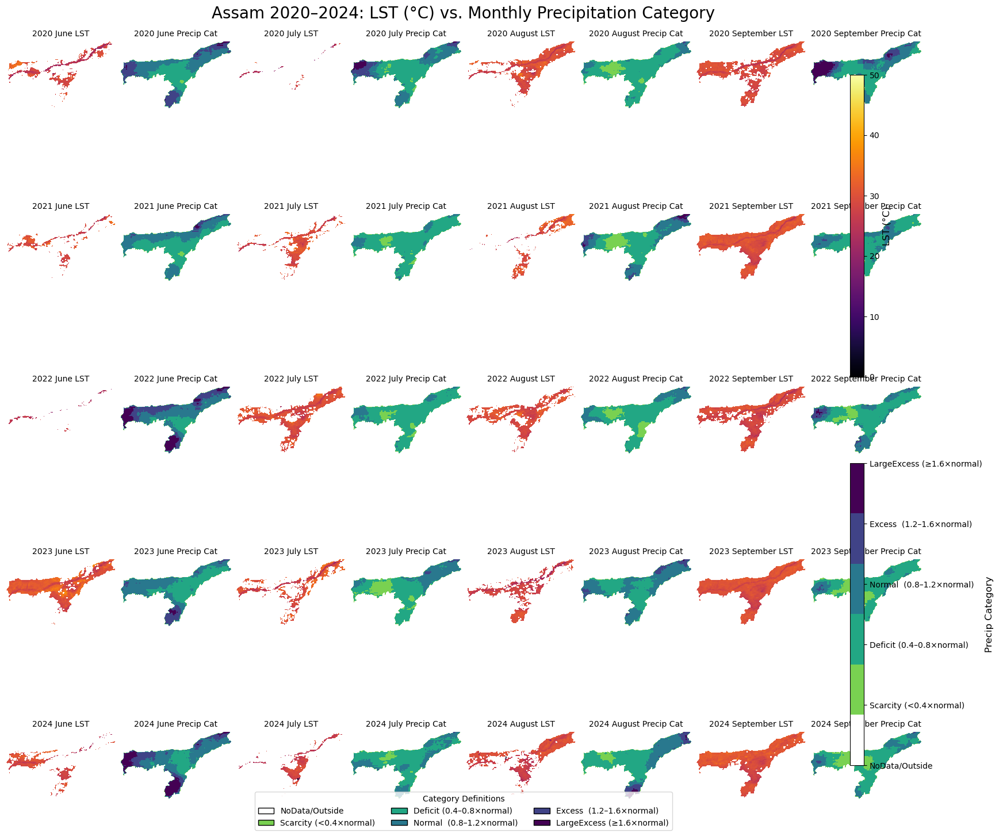

In [50]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LST TIFF:  Assumes 20 bands in order (2020–2024 × 4 months: June, July, August, September)
#    - Precip GT TIFF: Assumes 25 bands in order (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
lst_tiff_path  = "Assam_X_LST.tif"
precip_tiff_path = "Assam_Y_Precipitation_GT_geotif.tif"

for p in (lst_tiff_path, precip_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    lst_profile = src_lst.profile.copy()
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND PRECIP GT TIFF (2020–2024 × 5 bands)
# -----------------------------------------------------------------------------
with rasterio.open(precip_tiff_path) as src_pr:
    precip_full = src_pr.read().astype(np.int8)  # shape = (25, H, W)

n_pr_bands = precip_full.shape[0]
if n_pr_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_tiff_path}, but found {n_pr_bands}")

# -----------------------------------------------------------------------------
# 4) EXTRACT ONLY THE 20 MONTHLY PRECIP BANDS (ignore each year's “Total”)
#    Year 2020: indices 0–3 (June, July, Aug, Sept), drop 4 (Total)
#    Year 2021: indices 5–8, drop 9
#    Year 2022: indices 10–13, drop 14
#    Year 2023: indices 15–18, drop 19
#    Year 2024: indices 20–23, drop 24
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# precip_monthly will have shape (20, H, W)
precip_bands = precip_full[monthly_indices, :, :]

# -----------------------------------------------------------------------------
# 5) DEFINE YEARS AND MONTHS
#    Years:  [2020, 2021, 2022, 2023, 2024]
#    Months: ["June", "July", "August", "September"]
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 6) PREPARE COLORMAPS
#    a) LST: continuous “inferno” palette from vmin=20 to vmax=45 °C
#    b) Precip categories: discrete 6‐color palette (0…5)
#       (0=NoData, 1=Scarcity, 2=Deficit, 3=Normal, 4=Excess, 5=LargeExcess)
# -----------------------------------------------------------------------------
# 6a) LST colormap
lst_cmap = plt.get_cmap("inferno")
lst_vmin = 0.0
lst_vmax = 50.0

# 6b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 7) BUILD FIGURE: 5 ROWS × 8 COLUMNS (for each year: 4 × (LST + Precip))
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_years,
    ncols=n_months * 2,
    figsize=(n_months * 4, n_years * 3),
    constrained_layout=True
)
fig.suptitle("Assam 2020–2024: LST (°C) vs. Monthly Precipitation Category", fontsize=20, y=0.98)

# If only one year, ensure axes is 2D
if n_years == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 8) LOOP OVER YEARS AND MONTHS TO PLOT LST (left) and Precip (right)
# -----------------------------------------------------------------------------
for y_idx, year in enumerate(years):
    for m_idx, month in enumerate(month_names):
        # 8a) LST index = (y_idx * 4) + m_idx
        lst_idx = y_idx * n_months + m_idx
        lst_layer = lst_bands[lst_idx]  # shape = (H, W)

        # 8b) Precip index = (y_idx * 4) + m_idx
        pr_idx = y_idx * n_months + m_idx
        raw_pr = precip_bands[pr_idx]  # codes in { -1, 0..4 }

        # 8c) Shift codes: -1→0, 0→1, 1→2, 2→3, 3→4, 4→5
        pr_plot = np.full(raw_pr.shape, 0, dtype=np.int8)
        mask_valid = raw_pr != -1
        pr_plot[mask_valid] = raw_pr[mask_valid] + 1

        # 8d) Plot LST (left column for this month)
        ax_lst = axes[y_idx, 2 * m_idx]
        ax_lst.imshow(
            lst_layer,
            cmap=lst_cmap,
            vmin=lst_vmin,
            vmax=lst_vmax
        )
        ax_lst.set_title(f"{year} {month} LST", fontsize=10)
        ax_lst.axis("off")

        # 8e) Plot Precip category (right column)
        ax_pr = axes[y_idx, 2 * m_idx + 1]
        ax_pr.imshow(
            pr_plot,
            cmap=cluster_cmap,
            vmin=0,
            vmax=5
        )
        ax_pr.set_title(f"{year} {month} Precip Cat", fontsize=10)
        ax_pr.axis("off")

# -----------------------------------------------------------------------------
# 9) ADD COLORBARS
#    a) LST colorbar (right of last LST column)
#    b) Precip colorbar (right of last Precip column)
# -----------------------------------------------------------------------------
# a) LST colorbar
cbar_ax_lst = fig.add_axes([0.92, 0.55, 0.015, 0.35])  # [left, bottom, width, height]
plt.colorbar(
    plt.cm.ScalarMappable(norm=plt.Normalize(vmin=lst_vmin, vmax=lst_vmax), cmap=lst_cmap),
    cax=cbar_ax_lst,
    orientation="vertical"
).set_label("LST (°C)", fontsize=12)

# b) Precip colorbar
cbar_ax_pr = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_pr = plt.colorbar(
    plt.cm.ScalarMappable(norm=plt.Normalize(vmin=0, vmax=5), cmap=cluster_cmap),
    cax=cbar_ax_pr,
    orientation="vertical",
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar_pr.ax.set_yticklabels([
    cluster_labels[0],
    cluster_labels[1],
    cluster_labels[2],
    cluster_labels[3],
    cluster_labels[4],
    cluster_labels[5]
])
cbar_pr.set_label("Precip Category", fontsize=12)

# -----------------------------------------------------------------------------
# 10) ADD A LEGEND FOR PREIP CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.02)
)

plt.show()



/tmp/ipykernel_6584/1746505424.py:54: RuntimeWarning: invalid value encountered in cast
  precip_bands = precip_full[monthly_indices, :, :].astype(np.int8)  # shape = (20, H, W)


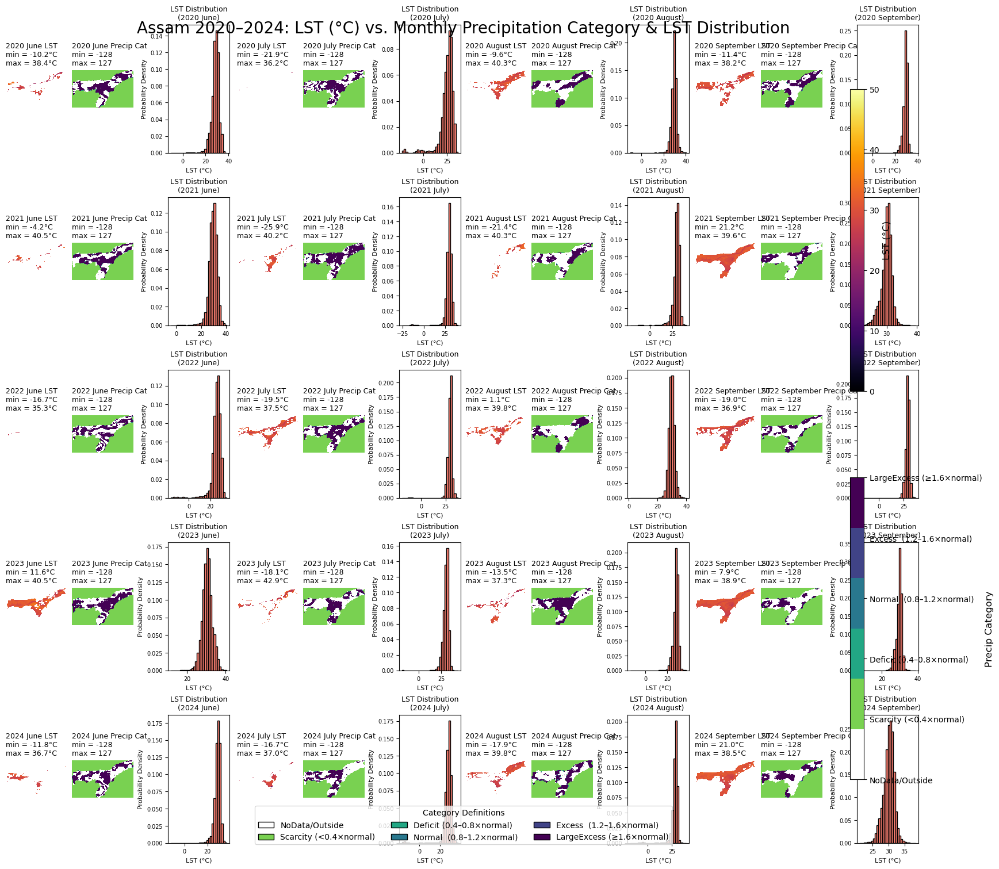

In [59]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LST TIFF:   20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precip TIFF: 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
lst_tiff_path    = "Assam_X_LST.tif"
precip_tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"

for p in (lst_tiff_path, precip_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND PRECIP TIFF (2020–2024 × 5 bands)
# -----------------------------------------------------------------------------
with rasterio.open(precip_tiff_path) as src_pr:
    precip_full = src_pr.read().astype(np.float32)  # shape = (25, H, W)

n_pr_bands = precip_full.shape[0]
if n_pr_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_tiff_path}, but found {n_pr_bands}")

# -----------------------------------------------------------------------------
# 4) EXTRACT ONLY THE 20 MONTHLY PRECIP BANDS (drop each year's “Total”)
#    Year 2020: take indices [0,1,2,3], drop index 4
#    Year 2021: take [5,6,7,8], drop 9
#    Year 2022: take [10,11,12,13], drop 14
#    Year 2023: take [15,16,17,18], drop 19
#    Year 2024: take [20,21,22,23], drop 24
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_bands = precip_full[monthly_indices, :, :].astype(np.int8)  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 5) DEFINE YEARS AND MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 6) PREPARE COLORMAPS
#    a) LST: continuous “inferno” palette, vmin=0 → vmax=50 (°C)
#    b) Precip categories: discrete 6‐color palette (0…5)
#       (0=NoData, 1=Scarcity, 2=Deficit, 3=Normal, 4=Excess, 5=LargeExcess)
# -----------------------------------------------------------------------------
# 6a) LST colormap
lst_cmap = plt.get_cmap("inferno")
lst_vmin = 0.0
lst_vmax = 50.0

# 6b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 7) BUILD FIGURE: 5 ROWS × 12 COLUMNS (for each year: 4 × (LST + Precip + Histogram))
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_years,
    ncols=n_months * 3,
    figsize=(n_months * 4, n_years * 3),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: LST (°C) vs. Monthly Precipitation Category & LST Distribution",
    fontsize=20, y=0.98
)

# If only one year, make sure axes is 2D
if n_years == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 8) LOOP OVER YEARS AND MONTHS – PLOT LST, PRECIp CATEGORY, AND HISTOGRAM
# -----------------------------------------------------------------------------
for y_idx, year in enumerate(years):
    for m_idx, month in enumerate(month_names):
        # 8a) LST index = (y_idx * 4) + m_idx
        lst_idx = y_idx * n_months + m_idx
        lst_layer = lst_bands[lst_idx]  # shape = (H, W)

        # Compute LST min/max (ignore NaNs)
        lst_valid = lst_layer[~np.isnan(lst_layer)]
        lst_min = float(np.nanmin(lst_valid)) if lst_valid.size else np.nan
        lst_max = float(np.nanmax(lst_valid)) if lst_valid.size else np.nan

        # 8b) Precip index = (y_idx * 4) + m_idx
        pr_idx = y_idx * n_months + m_idx
        raw_pr = precip_bands[pr_idx]  # codes in { -1, 0..4 }

        # Compute Precip min/max (excluding -1)
        pr_valid = raw_pr[raw_pr != -1]
        pr_min = float(np.nanmin(pr_valid)) if pr_valid.size else np.nan
        pr_max = float(np.nanmax(pr_valid)) if pr_valid.size else np.nan

        # Shift codes: -1→0, 0→1, 1→2, 2→3, 3→4, 4→5
        pr_plot = np.full(raw_pr.shape, 0, dtype=np.int8)
        mask_valid = raw_pr != -1
        pr_plot[mask_valid] = raw_pr[mask_valid] + 1

        # 8c) Plot LST (left column)
        ax_lst = axes[y_idx, 3 * m_idx]
        im_lst = ax_lst.imshow(
            lst_layer,
            cmap=lst_cmap,
            vmin=lst_vmin,
            vmax=lst_vmax
        )
        ax_lst.set_title(
            f"{year} {month} LST\n"
            f"min = {lst_min:.1f}°C\n"
            f"max = {lst_max:.1f}°C",
            fontsize=9,
            loc="left"
        )
        ax_lst.axis("off")

        # 8d) Plot Precip category (middle column)
        ax_pr = axes[y_idx, 3 * m_idx + 1]
        im_pr = ax_pr.imshow(
            pr_plot,
            cmap=cluster_cmap,
            vmin=0,
            vmax=5
        )
        ax_pr.set_title(
            f"{year} {month} Precip Cat\n"
            f"min = {pr_min:.0f}\n"
            f"max = {pr_max:.0f}",
            fontsize=9,
            loc="left"
        )
        ax_pr.axis("off")

        # 8e) Plot LST histogram (right column)
        ax_hist = axes[y_idx, 3 * m_idx + 2]
        ax_hist.hist(
            lst_valid.flatten(), 
            bins=30, 
            density=True, 
            edgecolor="black", 
            color="salmon"
        )
        ax_hist.set_title(f"LST Distribution\n({year} {month})", fontsize=9)
        ax_hist.set_xlabel("LST (°C)", fontsize=8)
        ax_hist.set_ylabel("Probability Density", fontsize=8)
        ax_hist.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 9) ADD COLORBARS
#    a) LST colorbar on far right of all LST columns
#    b) Precip category colorbar on far right of all Precip columns
# -----------------------------------------------------------------------------
# a) LST colorbar
cbar_ax_lst = fig.add_axes([0.92, 0.55, 0.015, 0.35])  # [left, bottom, width, height]
plt.colorbar(
    plt.cm.ScalarMappable(norm=plt.Normalize(vmin=lst_vmin, vmax=lst_vmax), cmap=lst_cmap),
    cax=cbar_ax_lst,
    orientation="vertical"
).set_label("LST (°C)", fontsize=12)

# b) Precip category colorbar
cbar_ax_pr = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_pr = plt.colorbar(
    plt.cm.ScalarMappable(norm=plt.Normalize(vmin=0, vmax=5), cmap=cluster_cmap),
    cax=cbar_ax_pr,
    orientation="vertical",
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar_pr.ax.set_yticklabels([
    cluster_labels[0],
    cluster_labels[1],
    cluster_labels[2],
    cluster_labels[3],
    cluster_labels[4],
    cluster_labels[5]
])
cbar_pr.set_label("Precip Category", fontsize=12)

# -----------------------------------------------------------------------------
# 10) ADD A LEGEND FOR PREIP CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.02)
)

plt.show()


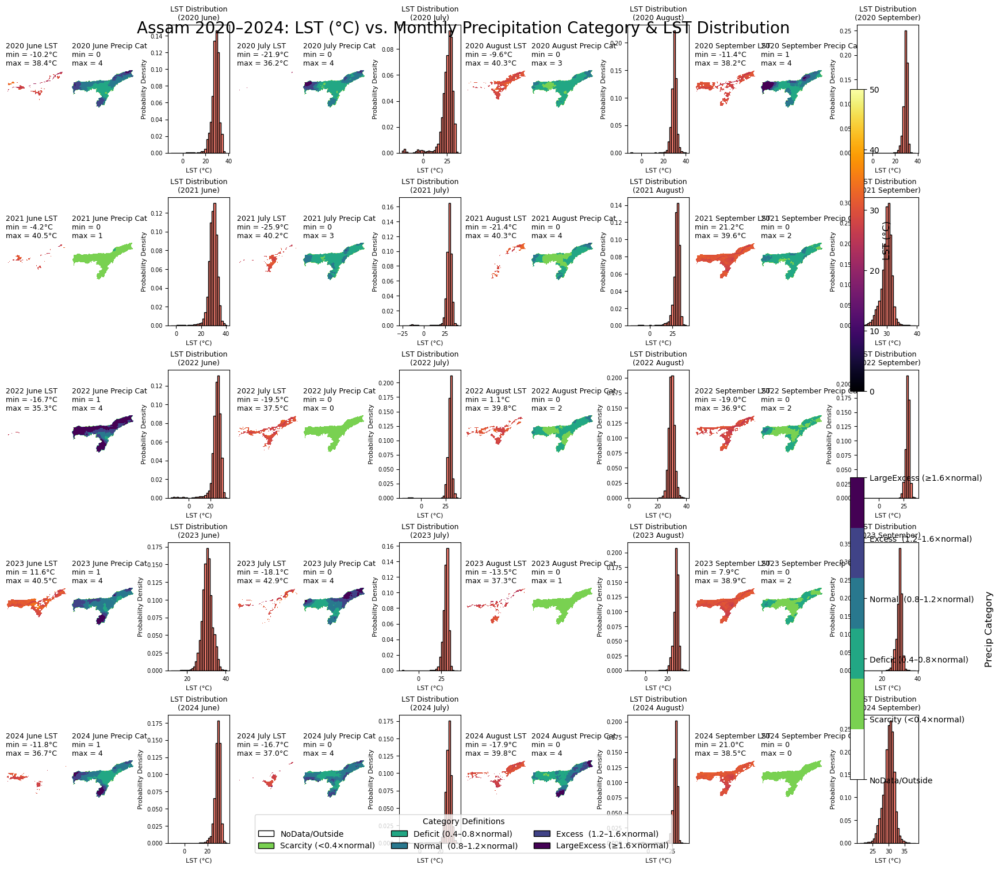

In [65]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LST TIFF:   must be 20 bands (2020–2024 × 4 months: June, July, August, September)
#    - CHIRPS TIFF: must be 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
lst_tiff_path    = "Assam_X_LST.tif"
chirps_tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"

for p in (lst_tiff_path, chirps_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months each)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    lst_profile = src_lst.profile.copy()
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND CHIRPS PRECIP TIFF (2020–2024 × 5 bands each year)
# -----------------------------------------------------------------------------
with rasterio.open(chirps_tiff_path) as src_ch:
    chirps_full = src_ch.read().astype(np.float32)  # shape = (25, H, W)

n_ch_bands = chirps_full.shape[0]
if n_ch_bands != 25:
    raise ValueError(f"Expected 25 bands in {chirps_tiff_path}, but found {n_ch_bands}")

# -----------------------------------------------------------------------------
# 4) DEFINE “NORMAL” VALUES FOR JUNE, JULY, AUG, SEPT, AND TOTAL
# -----------------------------------------------------------------------------
normals = np.array([
    486.6,   # June
    552.3,   # July
    394.7,   # August
    328.6,   # September
   1762.2    # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 5) CATEGORIZATION FUNCTION (same as before)
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array `band_data` of raw precipitation (mm) and a scalar `normal_value`,
    return a 2D integer array of the same shape with:
       -1 → NoData / outside Assam (where `band_data` is NaN)
        0 → Scarcity   (value < 0.4×normal)
        1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
        2 → Normal     (0.8×normal ≤ value < 1.2×normal)
        3 → Excess     (1.2×normal ≤ value < 1.6×normal)
        4 → LargeExcess(value ≥ 1.6×normal)
    """
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    valid_mask = ~np.isnan(band_data)
    if valid_mask.any():
        vals = band_data[valid_mask]
        ratio = vals / normal_value
        cat_vals = np.full(vals.shape, -1, dtype=np.int8)

        cat_vals[ ratio < 0.4 ]               = 0
        cat_vals[ (ratio >= 0.4) & (ratio < 0.8) ] = 1
        cat_vals[ (ratio >= 0.8) & (ratio < 1.2) ] = 2
        cat_vals[ (ratio >= 1.2) & (ratio < 1.6) ] = 3
        cat_vals[ ratio >= 1.6 ]              = 4

        cat[valid_mask] = cat_vals

    return cat

# -----------------------------------------------------------------------------
# 6) EXTRACT THE 20 RAW MONTHLY CHIRPS BANDS (drop each year's “Total”)
#    Year 2020: indices 0–3 → June, July, Aug, Sept (drop index 4)
#    Year 2021: indices 5–8 → June, July, Aug, Sept (drop index 9)
#    Year 2022: indices 10–13 (drop 14)
#    Year 2023: indices 15–18 (drop 19)
#    Year 2024: indices 20–23 (drop 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Now `chirps_bands_raw` has shape (20, H, W), each entry in mm
chirps_bands_raw = chirps_full[monthly_indices, :, :].copy()

# -----------------------------------------------------------------------------
# 7) APPLY CATEGORIZATION TO THOSE 20 BANDS
#    (produces integer codes ∈ { -1, 0, 1, 2, 3, 4 })
# -----------------------------------------------------------------------------
precip_cat_stack = np.full(chirps_bands_raw.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(20):
    month_idx = band_idx % 5  # 0→June, 1→July, 2→Aug, 3→Sept, 4→(never occurs here)
    normal_val = normals[month_idx]
    band_data = chirps_bands_raw[band_idx]
    precip_cat_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 8) DEFINE YEARS AND MONTHS ORDER
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 9) PREPARE COLORMAPS
#    a) LST: continuous inferno (vmin=0, vmax=50 °C)
#    b) Precip category: discrete 6‐color (0→white, 1→scarcity, … 5→large excess)
# -----------------------------------------------------------------------------
# 9a) LST colormap
lst_cmap = plt.get_cmap("inferno")
lst_vmin = 0.0
lst_vmax = 50.0

# 9b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 10) BUILD FIGURE: 5 ROWS × 12 COLUMNS (for each year: 4 × [LST_map, PrecipCat_map, LST_hist])
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_years,
    ncols=n_months * 3,import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LST TIFF:   must be 20 bands (2020–2024 × 4 months: June, July, August, September)
#    - CHIRPS TIFF: must be 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
lst_tiff_path    = "Assam_X_LST.tif"
chirps_tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"

for p in (lst_tiff_path, chirps_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months each)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    lst_profile = src_lst.profile.copy()
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND CHIRPS PRECIP TIFF (2020–2024 × 5 bands each year)
# -----------------------------------------------------------------------------
with rasterio.open(chirps_tiff_path) as src_ch:
    chirps_full = src_ch.read().astype(np.float32)  # shape = (25, H, W)

n_ch_bands = chirps_full.shape[0]
if n_ch_bands != 25:
    raise ValueError(f"Expected 25 bands in {chirps_tiff_path}, but found {n_ch_bands}")

# -----------------------------------------------------------------------------
# 4) DEFINE “NORMAL” VALUES FOR JUNE, JULY, AUG, SEPT, AND TOTAL
# -----------------------------------------------------------------------------
normals = np.array([
    486.6,   # June
    552.3,   # July
    394.7,   # August
    328.6,   # September
   1762.2    # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 5) CATEGORIZATION FUNCTION (same as before)
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array `band_data` of raw precipitation (mm) and a scalar `normal_value`,
    return a 2D integer array of the same shape with:
       -1 → NoData / outside Assam (where `band_data` is NaN)
        0 → Scarcity   (value < 0.4×normal)
        1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
        2 → Normal     (0.8×normal ≤ value < 1.2×normal)
        3 → Excess     (1.2×normal ≤ value < 1.6×normal)
        4 → LargeExcess(value ≥ 1.6×normal)
    """
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    valid_mask = ~np.isnan(band_data)
    if valid_mask.any():
        vals = band_data[valid_mask]
        ratio = vals / normal_value
        cat_vals = np.full(vals.shape, -1, dtype=np.int8)

        cat_vals[ ratio < 0.4 ]               = 0
        cat_vals[ (ratio >= 0.4) & (ratio < 0.8) ] = 1
        cat_vals[ (ratio >= 0.8) & (ratio < 1.2) ] = 2
        cat_vals[ (ratio >= 1.2) & (ratio < 1.6) ] = 3
        cat_vals[ ratio >= 1.6 ]              = 4

        cat[valid_mask] = cat_vals

    return cat

# -----------------------------------------------------------------------------
# 6) EXTRACT THE 20 RAW MONTHLY CHIRPS BANDS (drop each year's “Total”)
#    Year 2020: indices 0–3 → June, July, Aug, Sept (drop index 4)
#    Year 2021: indices 5–8 → June, July, Aug, Sept (drop index 9)
#    Year 2022: indices 10–13 (drop 14)
#    Year 2023: indices 15–18 (drop 19)
#    Year 2024: indices 20–23 (drop 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Now `chirps_bands_raw` has shape (20, H, W), each entry in mm
chirps_bands_raw = chirps_full[monthly_indices, :, :].copy()

# -----------------------------------------------------------------------------
# 7) APPLY CATEGORIZATION TO THOSE 20 BANDS
#    (produces integer codes ∈ { -1, 0, 1, 2, 3, 4 })
# -----------------------------------------------------------------------------
precip_cat_stack = np.full(chirps_bands_raw.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(20):
    month_idx = band_idx % 5  # 0→June, 1→July, 2→Aug, 3→Sept, 4→(never occurs here)
    normal_val = normals[month_idx]
    band_data = chirps_bands_raw[band_idx]
    precip_cat_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 8) DEFINE YEARS AND MONTHS ORDER
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 9) PREPARE COLORMAPS
#    a) LST: continuous inferno (vmin=0, vmax=50 °C)
#    b) Precip category: discrete 6‐color (0→white, 1→scarcity, … 5→large excess)
# -----------------------------------------------------------------------------
# 9a) LST colormap
lst_cmap = plt.get_cmap("inferno")
lst_vmin = 0.0
lst_vmax = 50.0

# 9b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 10) BUILD FIGURE: 5 ROWS × 12 COLUMNS (for each year: 4 × [LST_map, PrecipCat_map, LST_hist])
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_years,
    ncols=n_months * 3,
    figsize=(n_months * 4, n_years * 3),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: LST (°C) vs. Monthly Precipitation Category & LST Distribution",
    fontsize=20, 
    y=0.98
)

# If only one year, make sure `axes` is 2D
if n_years == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 11) LOOP OVER YEARS & MONTHS
#   - Plot LST map with min/max on separate lines
#   - Plot Precip category map with min/max on separate lines
#   - Plot LST histogram (density)
# -----------------------------------------------------------------------------
for y_idx, year in enumerate(years):
    for m_idx, month in enumerate(month_names):
        # --- LST layer and stats ---
        lst_index = y_idx * n_months + m_idx
        lst_layer = lst_bands[lst_index]
        valid_lst = lst_layer[~np.isnan(lst_layer)]
        lst_min = float(np.nanmin(valid_lst)) if valid_lst.size else np.nan
        lst_max = float(np.nanmax(valid_lst)) if valid_lst.size else np.nan

        # --- Precip category layer and stats ---
        pr_index = y_idx * n_months + m_idx
        raw_cat = precip_cat_stack[pr_index]  # ∈ { -1,0..4 }
        valid_pr = raw_cat[raw_cat != -1]
        pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else np.nan
        pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else np.nan

        # “Shift” codes from (−1..4) to (0..5) for plotting:
        #    -1→0, 0→1, 1→2, 2→3, 3→4, 4→5
        plot_pr = np.full(raw_cat.shape, 0, dtype=np.int8)
        mask_ok = (raw_cat != -1)
        plot_pr[mask_ok] = raw_cat[mask_ok] + 1

        # --- Plot LST map (first column) ---
        ax_lst = axes[y_idx, 3 * m_idx]
        im_lst = ax_lst.imshow(
            lst_layer,
            cmap=lst_cmap,
            vmin=lst_vmin,
            vmax=lst_vmax
        )
        ax_lst.set_title(import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LST TIFF:   must be 20 bands (2020–2024 × 4 months: June, July, August, September)
#    - CHIRPS TIFF: must be 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
lst_tiff_path    = "Assam_X_LST.tif"
chirps_tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"

for p in (lst_tiff_path, chirps_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months each)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    lst_profile = src_lst.profile.copy()
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND CHIRPS PRECIP TIFF (2020–2024 × 5 bands each year)
# -----------------------------------------------------------------------------
with rasterio.open(chirps_tiff_path) as src_ch:
    chirps_full = src_ch.read().astype(np.float32)  # shape = (25, H, W)

n_ch_bands = chirps_full.shape[0]
if n_ch_bands != 25:
    raise ValueError(f"Expected 25 bands in {chirps_tiff_path}, but found {n_ch_bands}")

# -----------------------------------------------------------------------------
# 4) DEFINE “NORMAL” VALUES FOR JUNE, JULY, AUG, SEPT, AND TOTAL
# -----------------------------------------------------------------------------
normals = np.array([
    486.6,   # June
    552.3,   # July
    394.7,   # August
    328.6,   # September
   1762.2    # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 5) CATEGORIZATION FUNCTION (same as before)
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array `band_data` of raw precipitation (mm) and a scalar `normal_value`,
    return a 2D integer array of the same shape with:
       -1 → NoData / outside Assam (where `band_data` is NaN)
        0 → Scarcity   (value < 0.4×normal)
        1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
        2 → Normal     (0.8×normal ≤ value < 1.2×normal)
        3 → Excess     (1.2×normal ≤ value < 1.6×normal)
        4 → LargeExcess(value ≥ 1.6×normal)
    """
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    valid_mask = ~np.isnan(band_data)
    if valid_mask.any():
        vals = band_data[valid_mask]
        ratio = vals / normal_value
        cat_vals = np.full(vals.shape, -1, dtype=np.int8)

        cat_vals[ ratio < 0.4 ]               = 0
        cat_vals[ (ratio >= 0.4) & (ratio < 0.8) ] = 1
        cat_vals[ (ratio >= 0.8) & (ratio < 1.2) ] = 2
        cat_vals[ (ratio >= 1.2) & (ratio < 1.6) ] = 3
        cat_vals[ ratio >= 1.6 ]              = 4

        cat[valid_mask] = cat_vals

    return cat

# -----------------------------------------------------------------------------
# 6) EXTRACT THE 20 RAW MONTHLY CHIRPS BANDS (drop each year's “Total”)
#    Year 2020: indices 0–3 → June, July, Aug, Sept (drop index 4)
#    Year 2021: indices 5–8 → June, July, Aug, Sept (drop index 9)
#    Year 2022: indices 10–13 (drop 14)
#    Year 2023: indices 15–18 (drop 19)
#    Year 2024: indices 20–23 (drop 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Now `chirps_bands_raw` has shape (20, H, W), each entry in mm
chirps_bands_raw = chirps_full[monthly_indices, :, :].copy()

# -----------------------------------------------------------------------------
# 7) APPLY CATEGORIZATION TO THOSE 20 BANDS
#    (produces integer codes ∈ { -1, 0, 1, 2, 3, 4 })
# -----------------------------------------------------------------------------
precip_cat_stack = np.full(chirps_bands_raw.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(20):
    month_idx = band_idx % 5  # 0→June, 1→July, 2→Aug, 3→Sept, 4→(never occurs here)
    normal_val = normals[month_idx]
    band_data = chirps_bands_raw[band_idx]
    precip_cat_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 8) DEFINE YEARS AND MONTHS ORDER
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 9) PREPARE COLORMAPS
#    a) LST: continuous inferno (vmin=0, vmax=50 °C)
#    b) Precip category: discrete 6‐color (0→white, 1→scarcity, … 5→large excess)
# -----------------------------------------------------------------------------
# 9a) LST colormap
lst_cmap = plt.get_cmap("inferno")
lst_vmin = 0.0
lst_vmax = 50.0

# 9b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 10) BUILD FIGURE: 5 ROWS × 12 COLUMNS (for each year: 4 × [LST_map, PrecipCat_map, LST_hist])
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_years,
    ncols=n_months * 3,
    figsize=(n_months * 4, n_years * 3),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: LST (°C) vs. Monthly Precipitation Category & LST Distribution",
    fontsize=20, 
    y=0.98
)

# If only one year, make sure `axes` is 2D
if n_years == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 11) LOOP OVER YEARS & MONTHS
#   - Plot LST map with min/max on separate lines
#   - Plot Precip category map with min/max on separate lines
#   - Plot LST histogram (density)
# -----------------------------------------------------------------------------
for y_idx, year in enumerate(years):
    for m_idx, month in enumerate(month_names):
        # --- LST layer and stats ---
        lst_index = y_idx * n_months + m_idx
        lst_layer = lst_bands[lst_index]
        valid_lst = lst_layer[~np.isnan(lst_layer)]
        lst_min = float(np.nanmin(valid_lst)) if valid_lst.size else np.nan
        lst_max = float(np.nanmax(valid_lst)) if valid_lst.size else np.nan

        # --- Precip category layer and stats ---
        pr_index = y_idx * n_months + m_idx
        raw_cat = precip_cat_stack[pr_index]  # ∈ { -1,0..4 }
        valid_pr = raw_cat[raw_cat != -1]
        pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else np.nan
        pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else np.nan

        # “Shift” codes from (−1..4) to (0..5) for plotting:
        #    -1→0, 0→1, 1→2, 2→3, 3→4, 4→5
        plot_pr = np.full(raw_cat.shape, 0, dtype=np.int8)
        mask_ok = (raw_cat != -1)
        plot_pr[mask_ok] = raw_cat[mask_ok] + 1

        # --- Plot LST map (first column) ---
        ax_lst = axes[y_idx, 3 * m_idx]
        im_lst = ax_lst.imshow(
            lst_layer,
            cmap=lst_cmap,
            vmin=lst_vmin,
            vmax=lst_vmax
        )
        ax_lst.set_title(
            f"{year} {month} LST\n"
            f"min = {lst_min:.1f}°C\n"
            f"max = {lst_max:.1f}°C",
            fontsize=9,
            loc="left"
        )
        ax_lst.axis("off")

        # --- Plot Precip category map (second column) ---
        ax_pr = axes[y_idx, 3 * m_idx + 1]
        ax_pr.imshow(
            plot_pr,
            cmap=cluster_cmap,
            vmin=0,
            vmax=5
        )
        ax_pr.set_title(
            f"{year} {month} Precip Cat\n"
            f"min = {pr_min:.0f}\n"
            f"max = {pr_max:.0f}",
            fontsize=9,
            loc="left"
        )
        ax_pr.axis("off")

        # --- Plot LST histogram (third column) ---
        ax_hist = axes[y_idx, 3 * m_idx + 2]
        ax_hist.hist(
            valid_lst.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="salmon"
        )
        ax_hist.set_title(f"LST Distribution\n({year} {month})", fontsize=9)
        ax_hist.set_xlabel("LST (°C)", fontsize=8)
        ax_hist.set_ylabel("Probability Density", fontsize=8)
        ax_hist.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 12) ADD COLORBARS ON THE FAR RIGHT
#     - LST colorbar (vertical)
#     - Precip category colorbar (vertical)
# -----------------------------------------------------------------------------
# LST colorbar (20→50 °C)
cbar_ax_lst = fig.add_axes([0.92, 0.55, 0.015, 0.35])
plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=lst_vmin, vmax=lst_vmax),
        cmap=lst_cmap
    ),
    cax=cbar_ax_lst,
    orientation="vertical"
).set_label("LST (°C)", fontsize=12)

# Precip category colorbar
cbar_ax_pr = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_pr = plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=0, vmax=5),
        cmap=cluster_cmap
    ),
    cax=cbar_ax_pr,
    orientation="vertical",
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar_pr.ax.set_yticklabels([
    cluster_labels[0],
    cluster_labels[1],
    cluster_labels[2],
    cluster_labels[3],
    cluster_labels[4],
    cluster_labels[5]
])
cbar_pr.set_label("Precip Category", fontsize=12)

# -----------------------------------------------------------------------------
# 13) ADD A LEGEND FOR THE PRECIP CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.01)
)

plt.show()
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LST TIFF:   must be 20 bands (2020–2024 × 4 months: June, July, August, September)
#    - CHIRPS TIFF: must be 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
lst_tiff_path    = "Assam_X_LST.tif"
chirps_tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"

for p in (lst_tiff_path, chirps_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months each)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    lst_profile = src_lst.profile.copy()
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND CHIRPS PRECIP TIFF (2020–2024 × 5 bands each year)
# -----------------------------------------------------------------------------
with rasterio.open(chirps_tiff_path) as src_ch:
    chirps_full = src_ch.read().astype(np.float32)  # shape = (25, H, W)

n_ch_bands = chirps_full.shape[0]
if n_ch_bands != 25:
    raise ValueError(f"Expected 25 bands in {chirps_tiff_path}, but found {n_ch_bands}")

# -----------------------------------------------------------------------------
# 4) DEFINE “NORMAL” VALUES FOR JUNE, JULY, AUG, SEPT, AND TOTAL
# -----------------------------------------------------------------------------
normals = np.array([
    486.6,   # June
    552.3,   # July
    394.7,   # August
    328.6,   # September
   1762.2    # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 5) CATEGORIZATION FUNCTION (same as before)
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array `band_data` of raw precipitation (mm) and a scalar `normal_value`,
    return a 2D integer array of the same shape with:
       -1 → NoData / outside Assam (where `band_data` is NaN)
        0 → Scarcity   (value < 0.4×normal)
        1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
        2 → Normal     (0.8×normal ≤ value < 1.2×normal)
        3 → Excess     (1.2×normal ≤ value < 1.6×normal)
        4 → LargeExcess(value ≥ 1.6×normal)
    """
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    valid_mask = ~np.isnan(band_data)
    if valid_mask.any():
        vals = band_data[valid_mask]
        ratio = vals / normal_value
        cat_vals = np.full(vals.shape, -1, dtype=np.int8)

        cat_vals[ ratio < 0.4 ]               = 0
        cat_vals[ (ratio >= 0.4) & (ratio < 0.8) ] = 1
        cat_vals[ (ratio >= 0.8) & (ratio < 1.2) ] = 2
        cat_vals[ (ratio >= 1.2) & (ratio < 1.6) ] = 3
        cat_vals[ ratio >= 1.6 ]              = 4

        cat[valid_mask] = cat_vals

    return cat

# -----------------------------------------------------------------------------
# 6) EXTRACT THE 20 RAW MONTHLY CHIRPS BANDS (drop each year's “Total”)
#    Year 2020: indices 0–3 → June, July, Aug, Sept (drop index 4)
#    Year 2021: indices 5–8 → June, July, Aug, Sept (drop index 9)
#    Year 2022: indices 10–13 (drop 14)
#    Year 2023: indices 15–18 (drop 19)
#    Year 2024: indices 20–23 (drop 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Now `chirps_bands_raw` has shape (20, H, W), each entry in mm
chirps_bands_raw = chirps_full[monthly_indices, :, :].copy()

# -----------------------------------------------------------------------------
# 7) APPLY CATEGORIZATION TO THOSE 20 BANDS
#    (produces integer codes ∈ { -1, 0, 1, 2, 3, 4 })
# -----------------------------------------------------------------------------
precip_cat_stack = np.full(chirps_bands_raw.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(20):
    month_idx = band_idx % 5  # 0→June, 1→July, 2→Aug, 3→Sept, 4→(never occurs here)
    normal_val = normals[month_idx]
    band_data = chirps_bands_raw[band_idx]
    precip_cat_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 8) DEFINE YEARS AND MONTHS ORDER
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 9) PREPARE COLORMAPS
#    a) LST: continuous inferno (vmin=0, vmax=50 °C)
#    b) Precip category: discrete 6‐color (0→white, 1→scarcity, … 5→large excess)
# -----------------------------------------------------------------------------
# 9a) LST colormap
lst_cmap = plt.get_cmap("inferno")
lst_vmin = 0.0
lst_vmax = 50.0

# 9b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 10) BUILD FIGURE: 5 ROWS × 12 COLUMNS (for each year: 4 × [LST_map, PrecipCat_map, LST_hist])
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_years,
    ncols=n_months * 3,
    figsize=(n_months * 4, n_years * 3),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: LST (°C) vs. Monthly Precipitation Category & LST Distribution",
    fontsize=20, 
    y=0.98
)

# If only one year, make sure `axes` is 2D
if n_years == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 11) LOOP OVER YEARS & MONTHS
#   - Plot LST map with min/max on separate lines
#   - Plot Precip category map with min/max on separate lines
#   - Plot LST histogram (density)
# -----------------------------------------------------------------------------
for y_idx, year in enumerate(years):
    for m_idx, month in enumerate(month_names):
        # --- LST layer and stats ---
        lst_index = y_idx * n_months + m_idx
        lst_layer = lst_bands[lst_index]
        valid_lst = lst_layer[~np.isnan(lst_layer)]
        lst_min = float(np.nanmin(valid_lst)) if valid_lst.size else np.nan
        lst_max = float(np.nanmax(valid_lst)) if valid_lst.size else np.nan

        # --- Precip category layer and stats ---
        pr_index = y_idx * n_months + m_idx
        raw_cat = precip_cat_stack[pr_index]  # ∈ { -1,0..4 }
        valid_pr = raw_cat[raw_cat != -1]
        pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else np.nan
        pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else np.nan

        # “Shift” codes from (−1..4) to (0..5) for plotting:
        #    -1→0, 0→1, 1→2, 2→3, 3→4, 4→5
        plot_pr = np.full(raw_cat.shape, 0, dtype=np.int8)
        mask_ok = (raw_cat != -1)
        plot_pr[mask_ok] = raw_cat[mask_ok] + 1

        # --- Plot LST map (first column) ---
        ax_lst = axes[y_idx, 3 * m_idx]
        im_lst = ax_lst.imshow(
            lst_layer,
            cmap=lst_cmap,
            vmin=lst_vmin,
            vmax=lst_vmax
        )
        ax_lst.set_title(
            f"{year} {month} LST\n"
            f"min = {lst_min:.1f}°C\n"
            f"max = {lst_max:.1f}°C",
            fontsize=9,
            loc="left"
        )
        ax_lst.axis("off")

        # --- Plot Precip category map (second column) ---
        ax_pr = axes[y_idx, 3 * m_idx + 1]
        ax_pr.imshow(
            plot_pr,
            cmap=cluster_cmap,
            vmin=0,
            vmax=5
        )
        ax_pr.set_title(
            f"{year} {month} Precip Cat\n"
            f"min = {pr_min:.0f}\n"
            f"max = {pr_max:.0f}",
            fontsize=9,
            loc="left"
        )
        ax_pr.axis("off")

        # --- Plot LST histogram (third column) ---
        ax_hist = axes[y_idx, 3 * m_idx + 2]
        ax_hist.hist(
            valid_lst.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="salmon"
        )
        ax_hist.set_title(f"LST Distribution\n({year} {month})", fontsize=9)
        ax_hist.set_xlabel("LST (°C)", fontsize=8)
        ax_hist.set_ylabel("Probability Density", fontsize=8)
        ax_hist.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 12) ADD COLORBARS ON THE FAR RIGHT
#     - LST colorbar (vertical)
#     - Precip category colorbar (vertical)
# -----------------------------------------------------------------------------
# LST colorbar (20→50 °C)
cbar_ax_lst = fig.add_axes([0.92, 0.55, 0.015, 0.35])
plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=lst_vmin, vmax=lst_vmax),
        cmap=lst_cmap
    ),
    cax=cbar_ax_lst,
    orientation="vertical"
).set_label("LST (°C)", fontsize=12)

# Precip category colorbar
cbar_ax_pr = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_pr = plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=0, vmax=5),
        cmap=cluster_cmap
    ),
    cax=cbar_ax_pr,
    orientation="vertical",
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar_pr.ax.set_yticklabels([
    cluster_labels[0],
    cluster_labels[1],
    cluster_labels[2],
    cluster_labels[3],
    cluster_labels[4],
    cluster_labels[5]
])
cbar_pr.set_label("Precip Category", fontsize=12)

# -----------------------------------------------------------------------------
# 13) ADD A LEGEND FOR THE PRECIP CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.01)
)

plt.show()

            f"{year} {month} LST\n"
            f"min = {lst_min:.1f}°C\n"
            f"max = {lst_max:.1f}°C",
            fontsize=9,
            loc="left"
        )
        ax_lst.axis("off")

        # --- Plot Precip category map (second column) ---
        ax_pr = axes[y_idx, 3 * m_idx + 1]
        ax_pr.imshow(
            plot_pr,
            cmap=cluster_cmap,
            vmin=0,
            vmax=5
        )
        ax_pr.set_title(
            f"{year} {month} Precip Cat\n"
            f"min = {pr_min:.0f}\n"
            f"max = {pr_max:.0f}",
            fontsize=9,
            loc="left"
        )
        ax_pr.axis("off")

        # --- Plot LST histogram (third column) ---
        ax_hist = axes[y_idx, 3 * m_idx + 2]
        ax_hist.hist(
            valid_lst.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="salmon"
        )
        ax_hist.set_title(f"LST Distribution\n({year} {month})", fontsize=9)
        ax_hist.set_xlabel("LST (°C)", fontsize=8)
        ax_hist.set_ylabel("Probability Density", fontsize=8)
        ax_hist.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 12) ADD COLORBARS ON THE FAR RIGHT
#     - LST colorbar (vertical)
#     - Precip category colorbar (vertical)
# -----------------------------------------------------------------------------
# LST colorbar (20→50 °C)
cbar_ax_lst = fig.add_axes([0.92, 0.55, 0.015, 0.35])
plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=lst_vmin, vmax=lst_vmax),
        cmap=lst_cmap
    ),
    cax=cbar_ax_lst,
    orientation="vertical"
).set_label("LST (°C)", fontsize=12)

# Precip category colorbar
cbar_ax_pr = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_pr = plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=0, vmax=5),
        cmap=cluster_cmap
    ),
    cax=cbar_ax_pr,
    orientation="vertical",
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar_pr.ax.set_yticklabels([
    cluster_labels[0],
    cluster_labels[1],
    cluster_labels[2],
    cluster_labels[3],
    cluster_labels[4],
    cluster_labels[5]
])
cbar_pr.set_label("Precip Category", fontsize=12)

# -----------------------------------------------------------------------------
# 13) ADD A LEGEND FOR THE PRECIP CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.01)
)

plt.show()

    figsize=(n_months * 4, n_years * 3),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: LST (°C) vs. Monthly Precipitation Category & LST Distribution",
    fontsize=20, 
    y=0.98
)

# If only one year, make sure `axes` is 2D
if n_years == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 11) LOOP OVER YEARS & MONTHS
#   - Plot LST map with min/max on separate lines
#   - Plot Precip category map with min/max on separate lines
#   - Plot LST histogram (density)
# -----------------------------------------------------------------------------
for y_idx, year in enumerate(years):
    for m_idx, month in enumerate(month_names):
        # --- LST layer and stats ---
        lst_index = y_idx * n_months + m_idx
        lst_layer = lst_bands[lst_index]
        valid_lst = lst_layer[~np.isnan(lst_layer)]
        lst_min = float(np.nanmin(valid_lst)) if valid_lst.size else np.nan
        lst_max = float(np.nanmax(valid_lst)) if valid_lst.size else np.nan

        # --- Precip category layer and stats ---
        pr_index = y_idx * n_months + m_idx
        raw_cat = precip_cat_stack[pr_index]  # ∈ { -1,0..4 }
        valid_pr = raw_cat[raw_cat != -1]
        pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else np.nan
        pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else np.nan

        # “Shift” codes from (−1..4) to (0..5) for plotting:
        #    -1→0, 0→1, 1→2, 2→3, 3→4, 4→5
        plot_pr = np.full(raw_cat.shape, 0, dtype=np.int8)
        mask_ok = (raw_cat != -1)
        plot_pr[mask_ok] = raw_cat[mask_ok] + 1

        # --- Plot LST map (first column) ---
        ax_lst = axes[y_idx, 3 * m_idx]
        im_lst = ax_lst.imshow(
            lst_layer,
            cmap=lst_cmap,
            vmin=lst_vmin,
            vmax=lst_vmax
        )
        ax_lst.set_title(
            f"{year} {month} LST\n"
            f"min = {lst_min:.1f}°C\n"
            f"max = {lst_max:.1f}°C",
            fontsize=9,
            loc="left"
        )
        ax_lst.axis("off")

        # --- Plot Precip category map (second column) ---
        ax_pr = axes[y_idx, 3 * m_idx + 1]
        ax_pr.imshow(
            plot_pr,
            cmap=cluster_cmap,
            vmin=0,
            vmax=5
        )
        ax_pr.set_title(
            f"{year} {month} Precip Cat\n"
            f"min = {pr_min:.0f}\n"
            f"max = {pr_max:.0f}",
            fontsize=9,
            loc="left"
        )
        ax_pr.axis("off")

        # --- Plot LST histogram (third column) ---
        ax_hist = axes[y_idx, 3 * m_idx + 2]
        ax_hist.hist(
            valid_lst.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="salmon"
        )
        ax_hist.set_title(f"LST Distribution\n({year} {month})", fontsize=9)
        ax_hist.set_xlabel("LST (°C)", fontsize=8)
        ax_hist.set_ylabel("Probability Density", fontsize=8)
        ax_hist.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 12) ADD COLORBARS ON THE FAR RIGHT
#     - LST colorbar (vertical)
#     - Precip category colorbar (vertical)
# -----------------------------------------------------------------------------
# LST colorbar (20→50 °C)
cbar_ax_lst = fig.add_axes([0.92, 0.55, 0.015, 0.35])
plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=lst_vmin, vmax=lst_vmax),
        cmap=lst_cmap
    ),
    cax=cbar_ax_lst,
    orientation="vertical"
).set_label("LST (°C)", fontsize=12)
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - LST TIFF:   must be 20 bands (2020–2024 × 4 months: June, July, August, September)
#    - CHIRPS TIFF: must be 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
lst_tiff_path    = "Assam_X_LST.tif"
chirps_tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"

for p in (lst_tiff_path, chirps_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months each)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    lst_profile = src_lst.profile.copy()
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND CHIRPS PRECIP TIFF (2020–2024 × 5 bands each year)
# -----------------------------------------------------------------------------
with rasterio.open(chirps_tiff_path) as src_ch:
    chirps_full = src_ch.read().astype(np.float32)  # shape = (25, H, W)

n_ch_bands = chirps_full.shape[0]
if n_ch_bands != 25:
    raise ValueError(f"Expected 25 bands in {chirps_tiff_path}, but found {n_ch_bands}")

# -----------------------------------------------------------------------------
# 4) DEFINE “NORMAL” VALUES FOR JUNE, JULY, AUG, SEPT, AND TOTAL
# -----------------------------------------------------------------------------
normals = np.array([
    486.6,   # June
    552.3,   # July
    394.7,   # August
    328.6,   # September
   1762.2    # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 5) CATEGORIZATION FUNCTION (same as before)
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array `band_data` of raw precipitation (mm) and a scalar `normal_value`,
    return a 2D integer array of the same shape with:
       -1 → NoData / outside Assam (where `band_data` is NaN)
        0 → Scarcity   (value < 0.4×normal)
        1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
        2 → Normal     (0.8×normal ≤ value < 1.2×normal)
        3 → Excess     (1.2×normal ≤ value < 1.6×normal)
        4 → LargeExcess(value ≥ 1.6×normal)
    """
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    valid_mask = ~np.isnan(band_data)
    if valid_mask.any():
        vals = band_data[valid_mask]
        ratio = vals / normal_value
        cat_vals = np.full(vals.shape, -1, dtype=np.int8)

        cat_vals[ ratio < 0.4 ]               = 0
        cat_vals[ (ratio >= 0.4) & (ratio < 0.8) ] = 1
        cat_vals[ (ratio >= 0.8) & (ratio < 1.2) ] = 2
        cat_vals[ (ratio >= 1.2) & (ratio < 1.6) ] = 3
        cat_vals[ ratio >= 1.6 ]              = 4

        cat[valid_mask] = cat_vals

    return cat

# -----------------------------------------------------------------------------
# 6) EXTRACT THE 20 RAW MONTHLY CHIRPS BANDS (drop each year's “Total”)
#    Year 2020: indices 0–3 → June, July, Aug, Sept (drop index 4)
#    Year 2021: indices 5–8 → June, July, Aug, Sept (drop index 9)
#    Year 2022: indices 10–13 (drop 14)
#    Year 2023: indices 15–18 (drop 19)
#    Year 2024: indices 20–23 (drop 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Now `chirps_bands_raw` has shape (20, H, W), each entry in mm
chirps_bands_raw = chirps_full[monthly_indices, :, :].copy()

# -----------------------------------------------------------------------------
# 7) APPLY CATEGORIZATION TO THOSE 20 BANDS
#    (produces integer codes ∈ { -1, 0, 1, 2, 3, 4 })
# -----------------------------------------------------------------------------
precip_cat_stack = np.full(chirps_bands_raw.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(20):
    month_idx = band_idx % 5  # 0→June, 1→July, 2→Aug, 3→Sept, 4→(never occurs here)
    normal_val = normals[month_idx]
    band_data = chirps_bands_raw[band_idx]
    precip_cat_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 8) DEFINE YEARS AND MONTHS ORDER
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 9) PREPARE COLORMAPS
#    a) LST: continuous inferno (vmin=0, vmax=50 °C)
#    b) Precip category: discrete 6‐color (0→white, 1→scarcity, … 5→large excess)
# -----------------------------------------------------------------------------
# 9a) LST colormap
lst_cmap = plt.get_cmap("inferno")
lst_vmin = 0.0
lst_vmax = 50.0

# 9b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 10) BUILD FIGURE: 5 ROWS × 12 COLUMNS (for each year: 4 × [LST_map, PrecipCat_map, LST_hist])
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_years,
    ncols=n_months * 3,
    figsize=(n_months * 4, n_years * 3),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: LST (°C) vs. Monthly Precipitation Category & LST Distribution",
    fontsize=20, 
    y=0.98
)

# If only one year, make sure `axes` is 2D
if n_years == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 11) LOOP OVER YEARS & MONTHS
#   - Plot LST map with min/max on separate lines
#   - Plot Precip category map with min/max on separate lines
#   - Plot LST histogram (density)
# -----------------------------------------------------------------------------
for y_idx, year in enumerate(years):
    for m_idx, month in enumerate(month_names):
        # --- LST layer and stats ---
        lst_index = y_idx * n_months + m_idx
        lst_layer = lst_bands[lst_index]
        valid_lst = lst_layer[~np.isnan(lst_layer)]
        lst_min = float(np.nanmin(valid_lst)) if valid_lst.size else np.nan
        lst_max = float(np.nanmax(valid_lst)) if valid_lst.size else np.nan

        # --- Precip category layer and stats ---
        pr_index = y_idx * n_months + m_idx
        raw_cat = precip_cat_stack[pr_index]  # ∈ { -1,0..4 }
        valid_pr = raw_cat[raw_cat != -1]
        pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else np.nan
        pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else np.nan

        # “Shift” codes from (−1..4) to (0..5) for plotting:
        #    -1→0, 0→1, 1→2, 2→3, 3→4, 4→5
        plot_pr = np.full(raw_cat.shape, 0, dtype=np.int8)
        mask_ok = (raw_cat != -1)
        plot_pr[mask_ok] = raw_cat[mask_ok] + 1

        # --- Plot LST map (first column) ---
        ax_lst = axes[y_idx, 3 * m_idx]
        im_lst = ax_lst.imshow(
            lst_layer,
            cmap=lst_cmap,
            vmin=lst_vmin,
            vmax=lst_vmax
        )
        ax_lst.set_title(
            f"{year} {month} LST\n"
            f"min = {lst_min:.1f}°C\n"
            f"max = {lst_max:.1f}°C",
            fontsize=9,
            loc="left"
        )
        ax_lst.axis("off")

        # --- Plot Precip category map (second column) ---
        ax_pr = axes[y_idx, 3 * m_idx + 1]
        ax_pr.imshow(
            plot_pr,
            cmap=cluster_cmap,
            vmin=0,
            vmax=5
        )
        ax_pr.set_title(
            f"{year} {month} Precip Cat\n"
            f"min = {pr_min:.0f}\n"
            f"max = {pr_max:.0f}",
            fontsize=9,
            loc="left"
        )
        ax_pr.axis("off")

        # --- Plot LST histogram (third column) ---
        ax_hist = axes[y_idx, 3 * m_idx + 2]
        ax_hist.hist(
            valid_lst.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="salmon"
        )
        ax_hist.set_title(f"LST Distribution\n({year} {month})", fontsize=9)
        ax_hist.set_xlabel("LST (°C)", fontsize=8)
        ax_hist.set_ylabel("Probability Density", fontsize=8)
        ax_hist.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 12) ADD COLORBARS ON THE FAR RIGHT
#     - LST colorbar (vertical)
#     - Precip category colorbar (vertical)
# -----------------------------------------------------------------------------
# LST colorbar (20→50 °C)
cbar_ax_lst = fig.add_axes([0.92, 0.55, 0.015, 0.35])
plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=lst_vmin, vmax=lst_vmax),
        cmap=lst_cmap
    ),
    cax=cbar_ax_lst,
    orientation="vertical"
).set_label("LST (°C)", fontsize=12)

# Precip category colorbar
cbar_ax_pr = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_pr = plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=0, vmax=5),
        cmap=cluster_cmap
    ),
    cax=cbar_ax_pr,
    orientation="vertical",
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar_pr.ax.set_yticklabels([
    cluster_labels[0],
    cluster_labels[1],
    cluster_labels[2],
    cluster_labels[3],
    cluster_labels[4],
    cluster_labels[5]
])
cbar_pr.set_label("Precip Category", fontsize=12)

# -----------------------------------------------------------------------------
# 13) ADD A LEGEND FOR THE PRECIP CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.01)
)

plt.show()

# Precip category colorbar
cbar_ax_pr = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_pr = plt.colorbar(
    plt.cm.ScalarMappable(
        norm=plt.Normalize(vmin=0, vmax=5),
        cmap=cluster_cmap
    ),
    cax=cbar_ax_pr,
    orientation="vertical",
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar_pr.ax.set_yticklabels([
    cluster_labels[0],
    cluster_labels[1],
    cluster_labels[2],
    cluster_labels[3],
    cluster_labels[4],
    cluster_labels[5]
])
cbar_pr.set_label("Precip Category", fontsize=12)

# -----------------------------------------------------------------------------
# 13) ADD A LEGEND FOR THE PRECIP CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.01)
)

plt.show()


In [ ]:
##assam_X_NDVI

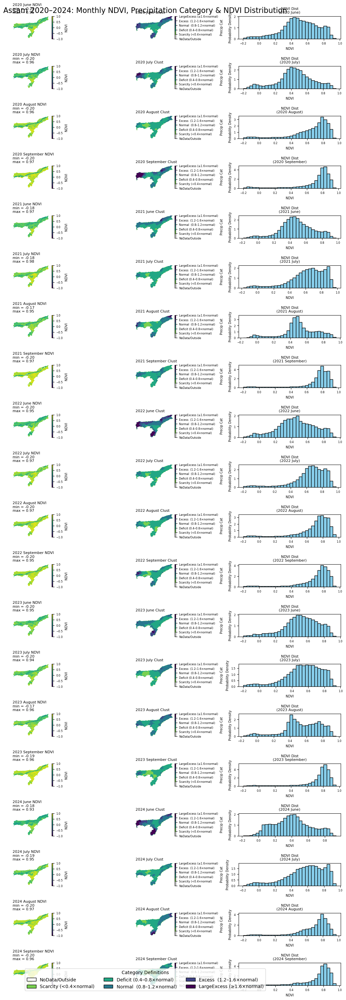

In [73]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - NDVI TIFF:   20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precip Category TIFF: 25 bands, but we'll pick only 20 monthly bands
# -----------------------------------------------------------------------------
ndvi_tiff_path   = "Assam_X_NDVI.tif"
precip_tiff_path = "Assam_Y_Precipitation_GT_geotif.tif"

for p in (ndvi_tiff_path, precip_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND NDVI TIFF
# -----------------------------------------------------------------------------
with rasterio.open(ndvi_tiff_path) as src_nd:
    ndvi_bands = src_nd.read().astype(np.float32)  # shape = (20, H, W)
    height, width = src_nd.height, src_nd.width

if ndvi_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {ndvi_tiff_path}, but found {ndvi_bands.shape[0]}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND PRECIP TIFF AND EXTRACT 20 MONTHLY CATEGORY BANDS
#    Each year has 5 bands (June, July, Aug, Sept, Total). We drop the “Total” band.
# -----------------------------------------------------------------------------
with rasterio.open(precip_tiff_path) as src_pr:
    precip_full = src_pr.read().astype(np.int8)  # shape = (25, H, W)

if precip_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_tiff_path}, but found {precip_full.shape[0]}")

# Build a list of the 20 monthly indices: [0,1,2,3, 5,6,7,8, 10,11,12,13, 15,16,17,18, 20,21,22,23]
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_bands = precip_full[monthly_indices, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 4) DEFINE YEAR & MONTH ARRAYS
# -----------------------------------------------------------------------------
years = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]

# -----------------------------------------------------------------------------
# 5) PREPARE COLORMAPS
#    a) NDVI: continuous “viridis” from -1 → 1
#    b) Precip categories: discrete 6 colors (0 = NoData, 1 = Scarcity, 2 = Deficit,
#       3 = Normal, 4 = Excess, 5 = LargeExcess)
# -----------------------------------------------------------------------------
# 5a) NDVI colormap
ndvi_cmap = plt.get_cmap("viridis")
ndvi_vmin, ndvi_vmax = -1.0, 1.0  # Full NDVI range

# 5b) Cluster colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal  (0.8–1.2×normal)",
    4: "Excess  (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 6) CREATE A 20×3 GRID (20 months × 3 panels: NDVI, Cluster, NDVI histogram)
# -----------------------------------------------------------------------------
n_months_total = 20  # 5 years × 4 months
fig, axes = plt.subplots(
    nrows=n_months_total,
    ncols=3,
    figsize=(12, n_months_total * 1.5),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: Monthly NDVI, Precipitation Category & NDVI Distribution",
    fontsize=16, y=0.995
)

# If by chance n_months_total=1, ensure axes is 2D
if axes.ndim == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 7) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_months_total):
    year_idx = i // 4
    month_idx = i % 4
    year = years[year_idx]
    month = month_names[month_idx]
    
    # --- NDVI layer and stats ---
    ndvi_layer = ndvi_bands[i]
    valid_ndvi = ndvi_layer[~np.isnan(ndvi_layer)]
    ndvi_min = float(np.nanmin(valid_ndvi)) if valid_ndvi.size else np.nan
    ndvi_max = float(np.nanmax(valid_ndvi)) if valid_ndvi.size else np.nan
    
    # --- Cluster codes (raw = -1..4) → shift to (0..5) for plotting ---
    raw_clust = precip_bands[i]
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1  # shift to 1..5
    
    # ----- Column 0: NDVI map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        ndvi_layer,
        cmap=ndvi_cmap,
        vmin=ndvi_vmin,
        vmax=ndvi_vmax
    )
    ax0.set_title(
        f"{year} {month} NDVI\n"
        f"min = {ndvi_min:.2f}\n"
        f"max = {ndvi_max:.2f}",
        fontsize=8, loc="left"
    )
    ax0.axis("off")
    
    # Add NDVI colorbar just to the right of this subplot
    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.02,  # make the colorbar narrow
        pad=0.02        # push it slightly outside so there's no overlap
    )
    cbar0.set_label("NDVI", fontsize=7)
    cbar0.ax.tick_params(labelsize=6)
    
    # ----- Column 1: Cluster map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5
    )
    ax1.set_title(
        f"{year} {month} Clust",
        fontsize=8, loc="left"
    )
    ax1.axis("off")
    
    # Add Cluster colorbar just to the right of this subplot
    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.02,
        pad=0.02
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ])
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Cat", fontsize=7)
    
    # ----- Column 2: NDVI histogram (distribution) -----
    ax2 = axes[i, 2]
    ax2.hist(
        valid_ndvi.flatten(),
        bins=30,
        density=True,
        edgecolor="black",
        color="skyblue"
    )
    ax2.set_title(
        f"NDVI Dist\n({year} {month})",
        fontsize=8
    )
    ax2.set_xlabel("NDVI", fontsize=7)
    ax2.set_ylabel("Probability Density", fontsize=7)
    ax2.tick_params(axis="both", labelsize=6)

# -----------------------------------------------------------------------------
# 8) ADD A LEGEND FOR THE CLUSTER CATEGORIES AT THE VERY BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.005)
)

plt.show()


In [ ]:
##assam_X_RH

In [ ]:
##Assam_X_Wind_Speed

In [ ]:
## chat gpt prompt 

In [ ]:
we want to visulise Assam_X_Wind_Speed.tif  and also want to show Wind speed distribution probability density  over the same range of wind speed and please try to maintain the consistency along all.we also want to include in it  Assam_Y_Precipitation_GT_geotif.tif. means 3 things for each month  of each year :  its wind speed visulisation ,its precipitation cluster visulisation,and its probabity distribution .please also include min and max of wind speed and precipitation against each month of each year

In [ ]:
##Assam_X_WInd_Speed_GEE

In [ ]:
// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Wind Speed for Assam (June–September, 2020–2024)
// using ERA5‐Land Hourly data (“ECMWF/ERA5_LAND/HOURLY”). We will produce
// 5 years × 4 months = 20 single‐band images, stack them into a single 20‐band
// GeoTIFF, and export as “Assam_X_Wind_Speed.tif”.
// --------------------------------------------------------------------------------

// 1. Load Assam boundary from GAUL level1 and display it
var states = ee.FeatureCollection("FAO/GAUL/2015/level1");
var assam  = states.filter(ee.Filter.eq('ADM1_NAME', 'Assam'));
Map.centerObject(assam, 7);
Map.addLayer(assam, { color: 'black' }, 'Assam Boundary');

// 2. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 3. Build a list of single‐band wind‐speed images (one per year & month)
var allBands = [];

// 3a. Loop over each year
years.forEach(function(year) {
  // 3b. Loop over each monsoon month (6=June, 7=July, 8=August, 9=September)
  months.forEach(function(m, idx) {
    // 3b.1 Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 3b.2 Load ERA5‐Land Hourly data for this month & Assam, selecting u & v at 10 m
    var era5 = ee.ImageCollection("ECMWF/ERA5_LAND/HOURLY")
                  .filterDate(start, end)
                  .filterBounds(assam)
                  .select(['u_component_of_wind_10m', 'v_component_of_wind_10m']);

    // 3b.3 For each hourly image, compute wind speed = sqrt(u² + v²)
    var windSpeedCollection = era5.map(function(img) {
      var u = img.select('u_component_of_wind_10m');
      var v = img.select('v_component_of_wind_10m');
      var speed = u.pow(2).add(v.pow(2)).sqrt().rename('wind_speed');
      return speed.copyProperties(img, img.propertyNames());
    });

    // 3b.4 Compute monthly mean wind speed, clip to Assam, rename band
    var monthlyAvg = windSpeedCollection
                       .mean()
                       .clip(assam)
                       .rename(year + '_' + monthNames[idx] + '_Wind');

    // 3b.5 (Optional) Print min/max to the Console for verification
    var stats = monthlyAvg.reduceRegion({
      reducer:    ee.Reducer.minMax(),
      geometry:   assam.geometry(),
      scale:      1000,
      bestEffort: true
    });
    print(year + ' ' + monthNames[idx] + ' Wind Speed min/max:', stats);

    // 3b.6 Add this single‐band image to the list
    allBands.push(monthlyAvg);

    // 3b.7 (Optional) Visualize each monthly wind‐speed layer on the map
    Map.addLayer(
      monthlyAvg,
      {
        min:     0.0,
        max:     8.0, 
        palette: ['white', 'cyan', 'blue', 'purple']
      },
      year + ' ' + monthNames[idx] + ' Wind Speed (m/s)'
    );
  });
});

// 4. Stack all 20 monthly bands into one multi‐band Image
var windMultiband = ee.Image.cat(allBands);

// 5. Export the 20‐band wind‐speed image to Google Drive
Export.image.toDrive({
  image:          windMultiband,
  description:    'Assam_X_Wind_Speed',    // Task name (no spaces)
  folder:         'GEE_Exports',           // Drive folder
  fileNamePrefix: 'Assam_X_Wind_Speed',    // Result → “Assam_X_Wind_Speed.tif”
  region:         assam.geometry(),        // Clip to Assam boundary
  scale:          1000,                    // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


In [ ]:
##Assam_X_Wind_Speed_Pythan_Visuliosation

In [ ]:
##here min and max from cluster

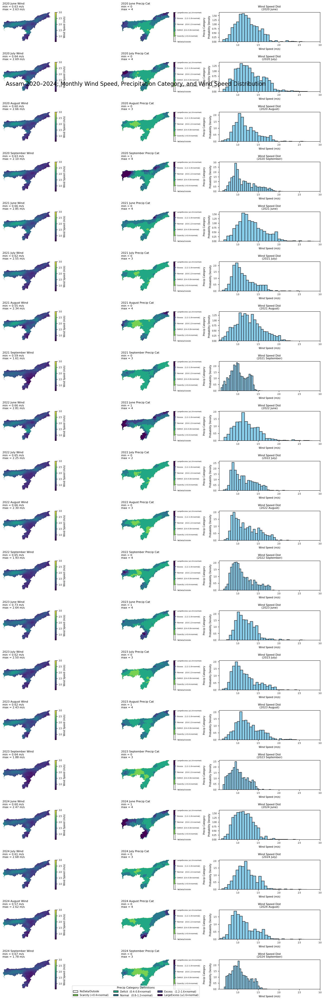

In [78]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import pandas as pd

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Wind Speed TIFF:  Assumes 20 bands in order (2020–2024 × 4 months: June, July, August, September)
#    - Precip Category TIFF: Assumes 25 bands in order (2020–2024 × 5 bands: June, July, August, September, Total)
# -----------------------------------------------------------------------------
wind_tiff_path   = "Assam_X_Wind_Speed.tif"
precip_tiff_path = "Assam_Y_Precipitation_GT_geotif.tif"

for p in (wind_tiff_path, precip_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND WIND SPEED TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(wind_tiff_path) as src_wind:
    wind_bands = src_wind.read().astype(np.float32)  # shape = (20, H, W)
    wind_profile = src_wind.profile.copy()
    height, width = src_wind.height, src_wind.width

n_wind_bands = wind_bands.shape[0]
if n_wind_bands != 20:
    raise ValueError(f"Expected 20 bands in {wind_tiff_path}, but found {n_wind_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND PRECIP CATEGORY TIFF (2020–2024 × 5 bands)
# -----------------------------------------------------------------------------
with rasterio.open(precip_tiff_path) as src_pr:
    precip_full = src_pr.read().astype(np.int8)  # shape = (25, H, W)
    precip_profile = src_pr.profile.copy()

n_pr_bands = precip_full.shape[0]
if n_pr_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_tiff_path}, but found {n_pr_bands}")

# -----------------------------------------------------------------------------
# 4) EXTRACT ONLY THE 20 MONTHLY PRECIP BANDS (ignore each year's “Total”)
#    Year 2020: indices 0–3 (June, July, Aug, Sept), drop 4 (Total)
#    Year 2021: indices 5–8, drop 9
#    Year 2022: indices 10–13, drop 14
#    Year 2023: indices 15–18, drop 19
#    Year 2024: indices 20–23, drop 24
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# precip_bands will have shape (20, H, W)
precip_bands = precip_full[monthly_indices, :, :]

# -----------------------------------------------------------------------------
# 5) DEFINE YEARS AND MONTHS
#    Years:  [2020, 2021, 2022, 2023, 2024]
#    Months: ["June", "July", "August", "September"]
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)      # 5
n_months    = len(month_names)  # 4

# -----------------------------------------------------------------------------
# 6) PREPARE COLORMAPS AND GLOBAL WIND SPEED RANGE
#    a) Wind speed: continuous “viridis” palette over the overall range
#    b) Precip categories: discrete 6‐color palette (0 = NoData/Outside, 1 = Scarcity, 2 = Deficit, 3 = Normal, 4 = Excess, 5 = LargeExcess)
# -----------------------------------------------------------------------------
# 6a) Compute the overall min/max wind speed across all 20 bands (ignoring NaNs)
valid_wind = wind_bands.flatten()
valid_wind = valid_wind[~np.isnan(valid_wind)]
wind_min = float(np.nanmin(valid_wind))
wind_max = float(np.nanmax(valid_wind))

# To keep consistency across months, we will use wind_vmin=0 and wind_vmax=wind_max rounded up
wind_vmin = max(0.0, wind_min)
wind_vmax = np.ceil(wind_max)

wind_cmap = plt.get_cmap("viridis")

# 6b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside
    "#79d151",  # 1 = Scarcity  (<0.4×normal)
    "#22a784",  # 2 = Deficit   (0.4–0.8×normal)
    "#29788e",  # 3 = Normal    (0.8–1.2×normal)
    "#404387",  # 4 = Excess    (1.2–1.6×normal)
    "#440154"   # 5 = LargeExcess (≥1.6×normal)
]
cluster_cmap = ListedColormap(cluster_colors)

cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 7) BUILD FIGURE: 20 ROWS × 3 COLUMNS
#    Each row corresponds to one month‐year combination, in chronological order:
#      Row  0 → 2020_June
#      Row  1 → 2020_July
#      Row  2 → 2020_August
#      Row  3 → 2020_September
#      Row  4 → 2021_June
#      … 
#      Row 19 → 2024_September
#    Columns: [0] Wind Speed Map | [1] Precip Cluster Map | [2] Wind Speed Distribution
# -----------------------------------------------------------------------------
n_total_months = n_years * n_months  # = 20
fig, axes = plt.subplots(
    nrows=n_total_months,
    ncols=3,
    figsize=(15, n_total_months * 2),  # height ~ 2" per row
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: Monthly Wind Speed, Precipitation Category, and Wind Speed Distribution",
    fontsize=16,
    y=0.92
)

# If only one row, ensure axes is 2D
if n_total_months == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 8) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total_months):
    year_idx  = i // n_months
    month_idx = i % n_months
    year      = years[year_idx]
    month     = month_names[month_idx]
    
    # -- a) Extract wind speed layer and compute min/max --
    wind_layer = wind_bands[i]  # shape = (H, W)
    valid_ws   = wind_layer[~np.isnan(wind_layer)]
    
    if valid_ws.size > 0:
        ws_min = float(np.nanmin(valid_ws))
        ws_max = float(np.nanmax(valid_ws))
    else:
        ws_min = np.nan
        ws_max = np.nan
    
    # -- b) Extract precip cluster layer, shift codes: raw = -1..4 → plot = 0..5 --
    raw_clust   = precip_bands[i]  # values in {-1, 0, 1, 2, 3, 4}
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid   = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1  # now in {1..5}; 0 = NoData
    
    # Compute precip min/max (raw values)
    valid_pc = raw_clust[mask_valid]
    if valid_pc.size > 0:
        pc_min = int(np.min(valid_pc))
        pc_max = int(np.max(valid_pc))
    else:
        pc_min = np.nan
        pc_max = np.nan
    
    # ------------------------ Column 0: Wind Speed Map ------------------------
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        wind_layer,
        cmap=wind_cmap,
        vmin=wind_vmin,
        vmax=wind_vmax
    )
    ax0.set_title(
        f"{year} {month} Wind\nmin = {ws_min:.2f} m/s\nmax = {ws_max:.2f} m/s",
        fontsize=8,
        loc="left"
    )
    ax0.axis("off")
    
    # Add Wind colorbar to the right of this subplot
    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar0.set_label("Wind Speed (m/s)", fontsize=7)
    cbar0.ax.tick_params(labelsize=6)
    
    # ------------------------ Column 1: Precip Cluster Map ------------------------
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5
    )
    ax1.set_title(
        f"{year} {month} Precip Cat\nmin = {pc_min}\nmax = {pc_max}",
        fontsize=8,
        loc="left"
    )
    ax1.axis("off")
    
    # Add Precip Cluster colorbar
    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ])
    cbar1.ax.tick_params(labelsize=5)
    cbar1.set_label("Precip Category", fontsize=7)
    
    # ------------------------ Column 2: Wind Speed Distribution ------------------------
    ax2 = axes[i, 2]
    # Plot histogram of valid wind speed with density normalization
    ax2.hist(
        valid_ws.flatten(),
        bins=30,
        density=True,
        edgecolor="black",
        color="skyblue"
    )
    ax2.set_xlim(wind_vmin, wind_vmax)
    ax2.set_title(
        f"Wind Speed Dist\n({year} {month})",
        fontsize=8
    )
    ax2.set_xlabel("Wind Speed (m/s)", fontsize=7)
    ax2.set_ylabel("Probability Density", fontsize=7)
    ax2.tick_params(axis="both", labelsize=6)

# -----------------------------------------------------------------------------
# 9) ADD A LEGEND FOR CLUSTER CATEGORIES AT THE BOTTOM CENTER ------------------
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=7,
    title_fontsize=8
)

plt.show()


In [ ]:
##heremin and max from rainfall

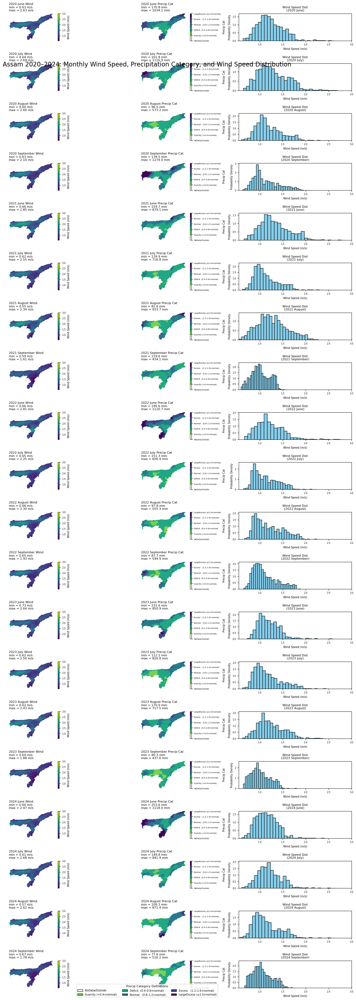

In [80]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Wind Speed TIFF:       20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precipitation RAW TIFF: 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
#    - Precipitation Category TIFF: 25 bands (2020–2024 × 5 bands of category codes)
#
#  We will extract the 20 monthly precipitation‐sum bands from the RAW TIFF in mm
#  to compute correct min/max rainfall values. The category TIFF remains the same.
# -----------------------------------------------------------------------------
wind_tiff_path        = "Assam_X_Wind_Speed.tif"
precip_raw_tiff_path  = "Assam_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Assam_Y_Precipitation_GT_geotif.tif"

for p in (wind_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND WIND SPEED TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(wind_tiff_path) as src_wind:
    wind_bands   = src_wind.read().astype(np.float32)  # shape = (20, H, W)
    height, width = src_wind.height, src_wind.width

n_wind_bands = wind_bands.shape[0]
if n_wind_bands != 20:
    raise ValueError(f"Expected 20 bands in {wind_tiff_path}, but found {n_wind_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND RAW PRECIPITATION TIFF (monthly sums in mm, 5 bands/year)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw_bands = precip_raw_full.shape[0]
if n_pr_raw_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw_bands}")

# -----------------------------------------------------------------------------
# 4) READ THE 25‐BAND PRECIPITATION CATEGORY TIFF (cats  -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat_bands = precip_cat_full.shape[0]
if n_pr_cat_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat_bands}")

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIP BANDS (ignore each year's “Total” at index 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Shapes: (20, H, W)
precip_raw_bands = precip_raw_full[monthly_indices, :, :]
precip_cat_bands = precip_cat_full[monthly_indices, :, :]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS AND MONTHS
#    Years:  [2020, 2021, 2022, 2023, 2024]
#    Months: ["June", "July", "August", "September"]
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)         # 5
n_months    = len(month_names)   # 4

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS
#    a) Wind speed: continuous “viridis” palette
#    b) Precip categories: discrete 6‐color palette (0..5)
# -----------------------------------------------------------------------------
# 7a) Determine overall wind speed range (ignore NaN)
valid_wind = wind_bands.flatten()
valid_wind = valid_wind[~np.isnan(valid_wind)]
wind_vmin = max(0.0, float(np.nanmin(valid_wind)))
wind_vmax = float(np.ceil(np.nanmax(valid_wind)))
wind_cmap  = plt.get_cmap("viridis")

# 7b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside
    "#79d151",  # 1 = Scarcity (<0.4×normal)
    "#22a784",  # 2 = Deficit  (0.4–0.8×normal)
    "#29788e",  # 3 = Normal   (0.8–1.2×normal)
    "#404387",  # 4 = Excess   (1.2–1.6×normal)
    "#440154"   # 5 = LargeExcess (≥1.6×normal)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
#    Each row corresponds to one month‐year combination (chronological):
#      Row  0 → 2020_June
#      Row  1 → 2020_July
#      …
#      Row 19 → 2024_September
#    Columns: [0] Wind Speed Map | [1] Precip Cat Map | [2] Wind Speed Distribution
# -----------------------------------------------------------------------------
n_total_months = n_years * n_months  # = 20
fig, axes = plt.subplots(
    nrows=n_total_months,
    ncols=3,
    figsize=(15, n_total_months * 1.8),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: Monthly Wind Speed, Precipitation Category, and Wind Speed Distribution\n",
    fontsize=16, y=0.94
)

# If only one row, force 2D axes
if n_total_months == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total_months):
    year_idx  = i // n_months
    month_idx = i % n_months
    year      = years[year_idx]
    month     = month_names[month_idx]
    
    # --- a) Wind Speed Layer & Stats ---
    wind_layer = wind_bands[i]  # (H, W)
    valid_ws = wind_layer[~np.isnan(wind_layer)]
    if valid_ws.size > 0:
        ws_min = float(np.nanmin(valid_ws))
        ws_max = float(np.nanmax(valid_ws))
    else:
        ws_min = np.nan
        ws_max = np.nan
    
    # --- b) Precip Raw Layer & Stats (in mm) ---
    raw_pr_layer = precip_raw_bands[i]  # (H, W) in mm
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = np.nan
        pr_max = np.nan
    
    # --- c) Precip Category Layer (codes -1..4 → plotted as 0..5) ---
    raw_clust = precip_cat_bands[i]    # values in {-1,0,1,2,3,4}
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1  # now in {1..5}
    
    # -------- Column 0: Wind Speed Map --------
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        wind_layer,
        cmap=wind_cmap,
        vmin=wind_vmin,
        vmax=wind_vmax
    )
    ax0.set_title(
        f"{year} {month} Wind\nmin = {ws_min:.2f} m/s\nmax = {ws_max:.2f} m/s",
        fontsize=8,
        loc="left"
    )
    ax0.axis("off")
    
    # Wind colorbar to the right of this subplot
    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar0.set_label("Wind Speed (m/s)", fontsize=7)
    cbar0.ax.tick_params(labelsize=6)
    
    # -------- Column 1: Precipitation Category Map --------
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5
    )
    ax1.set_title(
        f"{year} {month} Precip Cat\nmin = {pr_min:.1f} mm\nmax = {pr_max:.1f} mm",
        fontsize=8,
        loc="left"
    )
    ax1.axis("off")
    
    # Precip category colorbar
    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ])
    cbar1.ax.tick_params(labelsize=5)
    cbar1.set_label("Precip Cat", fontsize=7)
    
    # -------- Column 2: Wind Speed Distribution --------
    ax2 = axes[i, 2]
    ax2.hist(
        valid_ws.flatten(),
        bins=30,
        density=True,
        edgecolor="black",
        color="skyblue"
    )
    ax2.set_xlim(wind_vmin, wind_vmax)
    ax2.set_title(
        f"Wind Speed Dist\n({year} {month})",
        fontsize=8
    )
    ax2.set_xlabel("Wind Speed (m/s)", fontsize=7)
    ax2.set_ylabel("Probability Density", fontsize=7)
    ax2.tick_params(axis="both", labelsize=6)

# -----------------------------------------------------------------------------
# 10) ADD A LEGEND FOR PRECIP CATEGORIES AT THE BOTTOM CENTER ------------------
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=7,
    title_fontsize=8
)

plt.show()


In [ ]:
##Assam_X_LULC

In [ ]:
##Assam_X_LULC_GEE_javascript

In [ ]:
##Assam_X_prompt_for_LULC_visulisation

In [ ]:
 very very very nice we want this kind of result on LULC  ( path name: Assam_X_LULC.tif) and then we want to visulise Assam_X_LULC.tif  and also want to show LULC distribution probability density  over the same range of LULC and please try to maintain the consistency along all.we also want to include in it  Assam_Y_Precipitation_GT_geotif.tif. means 3 things for each month  of each year :  its LULC visulisation ,its precipitation cluster visulisation,and its probabity distribution .please also include min and max of precipitation  from  Assam_Y_Precipitation_CHIRPS.tif against each month of each year. for LULC you may need shape file SateMask/gadm41_IND_1.shp" .thanks a lot doing great work

In [ ]:
##Assam_X_LULC_Pythan_Visuliosation

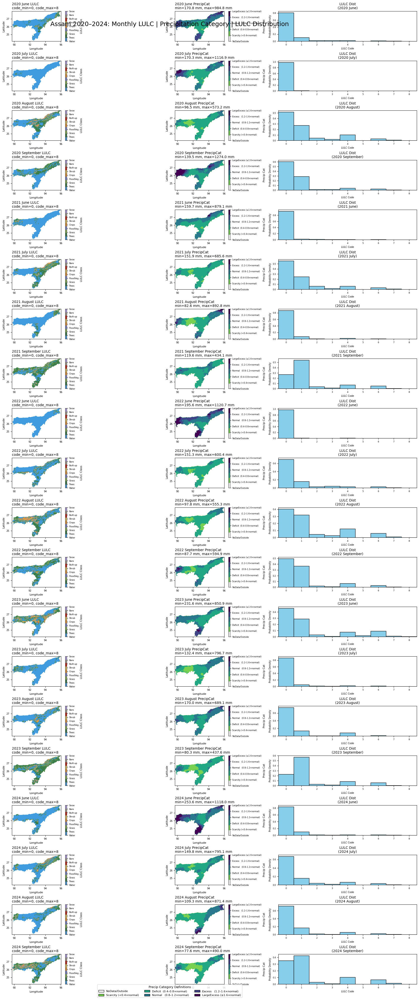

In [111]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
# -----------------------------------------------------------------------------
lulc_tiff_path       = "Assam_X_LULC.tif"
precip_raw_tiff_path = "Assam_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path = "Assam_Y_Precipitation_GT_geotif.tif"
assam_shapefile      = "SateMask/gadm41_IND_1.shp"

for path in (lulc_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, assam_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND LULC TIFF
# -----------------------------------------------------------------------------
with rasterio.open(lulc_tiff_path) as src_lulc:
    lulc_bands     = src_lulc.read().astype(np.float32)  # shape = (20, H, W)
    lulc_transform = src_lulc.transform
    lulc_crs       = src_lulc.crs
    height, width  = src_lulc.height, src_lulc.width
    bounds         = src_lulc.bounds

n_lulc_bands = lulc_bands.shape[0]
if n_lulc_bands != 20:
    raise ValueError(f"Expected 20 bands in {lulc_tiff_path}, but found {n_lulc_bands}")

# 2a) Load Assam shapefile and reproject to match LULC CRS
gdf = gpd.read_file(assam_shapefile)
gdf_assam = gdf[gdf["NAME_1"].str.lower() == "assam"].copy()
if gdf_assam.empty:
    raise ValueError("No feature named ‘Assam’ found in shapefile.")

if gdf_assam.crs != lulc_crs:
    gdf_assam = gdf_assam.to_crs(lulc_crs)

# 2b) Use union_all() instead of deprecated unary_union
assam_geom = [gdf_assam.geometry.union_all()]

# 2c) Build a boolean mask (True = inside Assam)
assam_mask = geometry_mask(
    assam_geom,
    transform = lulc_transform,
    invert    = True,            # keep pixels INSIDE Assam
    out_shape = (height, width)
)

# 2d) Set pixels outside Assam → NaN
for i in range(n_lulc_bands):
    band = lulc_bands[i]
    band[~assam_mask] = np.nan
    lulc_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw_bands = precip_raw_full.shape[0]
if n_pr_raw_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw_bands}")

# 3a) Mask raw precipitation outside Assam → NaN
for i in range(n_pr_raw_bands):
    arr = precip_raw_full[i]
    arr[~assam_mask] = np.nan
    precip_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat_bands = precip_cat_full.shape[0]
if n_pr_cat_bands != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat_bands}")

# 4a) Mask categories outside Assam → code = -1
for i in range(n_pr_cat_bands):
    arr = precip_cat_full[i]
    arr[~assam_mask] = -1
    precip_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIPITATION BANDS
#    (drop indices 4,9,14,19,24 → each year’s “Total”)
# -----------------------------------------------------------------------------
monthly_indices = []
for yr_idx in range(5):
    base = yr_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_raw_bands = precip_raw_full[monthly_indices, :, :]  # shape = (20, H, W)
precip_cat_bands = precip_cat_full[monthly_indices, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & GLOBAL STATISTICS
# -----------------------------------------------------------------------------
# 7a) Dynamic World palette (9 classes: 0..8)
dw_palette = [
    "#419bdf",  # 0 = Water
    "#397d49",  # 1 = Trees
    "#88b053",  # 2 = Grass
    "#7a87c6",  # 3 = Flooded Veg
    "#e49635",  # 4 = Crops
    "#dfc35a",  # 5 = Shrub & Scrub
    "#c4281b",  # 6 = Built-up
    "#a59b8f",  # 7 = Bare ground
    "#b39fe1"   # 8 = Snow & Ice
]
lulc_cmap = ListedColormap(dw_palette)
lulc_vmin, lulc_vmax = 0, 8

# 7b) Precip Category palette (shifted codes 0..5)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside  (orig code -1)
    "#79d151",  # 1 = Scarcity        (orig code 0)
    "#22a784",  # 2 = Deficit         (orig code 1)
    "#29788e",  # 3 = Normal          (orig code 2)
    "#404387",  # 4 = Excess          (orig code 3)
    "#440154"   # 5 = LargeExcess     (orig code 4)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# 7c) Global min/max of raw precipitation (in mm), ignoring NaNs
all_pr_vals = precip_raw_bands.flatten()
all_pr_vals = all_pr_vals[~np.isnan(all_pr_vals)]
if all_pr_vals.size > 0:
    pr_vmin = float(np.nanmin(all_pr_vals))
    pr_vmax = float(np.nanmax(all_pr_vals))
else:
    pr_vmin = pr_vmax = 0.0

# -----------------------------------------------------------------------------
# 8) CREATE THE FIGURE (20 rows × 3 columns) - but much larger!
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 2.0),     # <<==== Each row is 2″ tall, total ~40″ tall
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: Monthly LULC | Precipitation Category | LULC Distribution",
    fontsize=18, y=0.98
)

# If only one row, make axes 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP THROUGH EACH MONTH (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    year_idx  = i // n_months
    month_idx = i % n_months
    year      = years[year_idx]
    month     = month_names[month_idx]

    # (a) LULC layer & min/max
    lulc_layer = lulc_bands[i]
    valid_lulc = lulc_layer[~np.isnan(lulc_layer)]
    if valid_lulc.size > 0:
        lc_min = int(np.nanmin(valid_lulc))
        lc_max = int(np.nanmax(valid_lulc))
    else:
        lc_min = lc_max = None

    # (b) Raw precipitation & min/max
    raw_pr_layer = precip_raw_bands[i]
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # (c) Shift categorical codes −1..4 → 0..5
    raw_clust = precip_cat_bands[i]
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1

    # ---------------- Column 0: LULC Map ----------------
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        lulc_layer,
        cmap=lulc_cmap,
        vmin=lulc_vmin,
        vmax=lulc_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} LULC"
    if lc_min is not None and lc_max is not None:
        title0 += f"\ncode_min={lc_min}, code_max={lc_max}"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.set_xlabel("Longitude", fontsize=8)
    ax0.set_ylabel("Latitude", fontsize=8)
    ax0.tick_params(labelsize=7)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar0.set_ticks(np.arange(0, 9))
    cbar0.ax.set_yticklabels(
        ["Water", "Trees", "Grass", "FloodVeg", "Crops",
         "Shrub", "Built-up", "Bare", "Snow"],
        fontsize=6
    )
    cbar0.ax.tick_params(labelsize=6)
    cbar0.set_label("LULC Class", fontsize=8)

    # -------------- Column 1: Precipitation Category ----------------
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} PrecipCat"
    if pr_min is not None and pr_max is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.set_xlabel("Longitude", fontsize=8)
    ax1.set_ylabel("Latitude", fontsize=8)
    ax1.tick_params(labelsize=7)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels(
        [
            cluster_labels[0],
            cluster_labels[1],
            cluster_labels[2],
            cluster_labels[3],
            cluster_labels[4],
            cluster_labels[5]
        ],
        fontsize=6
    )
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Cat", fontsize=8)

    # -------------- Column 2: LULC Distribution (Histogram) ----------------
    ax2 = axes[i, 2]
    if valid_lulc.size > 0:
        bins = np.arange(-0.5, 9.5, 1.0)  # edges: -0.5, 0.5, 1.5, …, 8.5
        ax2.hist(
            valid_lulc.flatten(),
            bins=bins,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xticks(np.arange(0, 9))
        ax2.set_xticklabels(np.arange(0, 9), fontsize=6)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_xlim(-0.5, 8.5)
    ax2.set_title(f"LULC Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("LULC Code", fontsize=7)
    ax2.set_ylabel("Probability Density", fontsize=7)
    ax2.tick_params(axis="y", labelsize=6)
    ax2.tick_params(axis="x", labelsize=6, rotation=0)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at bottom center
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, -0.005),
    fontsize=8,
    title_fontsize=9
)

# Show the (very large) figure on screen
plt.show()


In [ ]:
##Assam_X_Soil_Moisture

In [ ]:
##Assam_X_Soil_Moisture_GEE

In [ ]:
##Assam_X_Soil_Moisture_Pythan_Visulisation

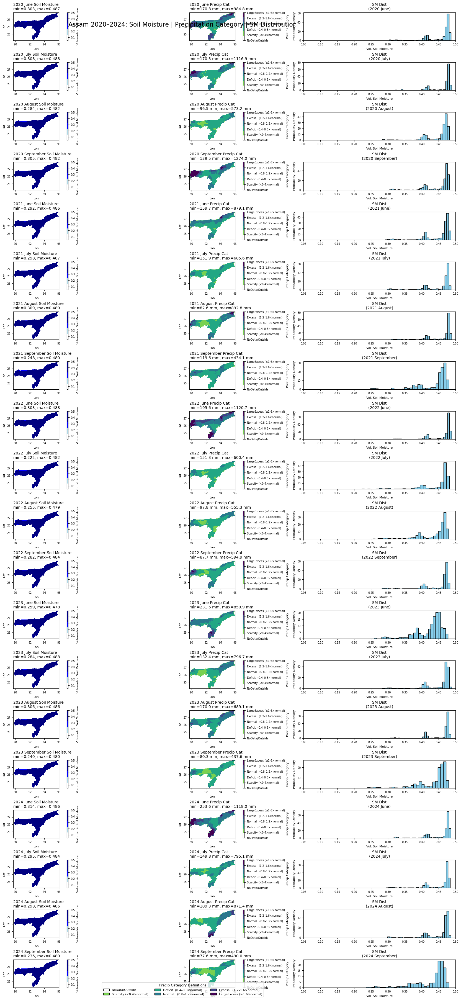

In [121]:
 import os
import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Soil Moisture TIFF:          20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Raw Precipitation TIFF:      25 bands (2020–2024 × 5 bands each: June, July, August, September, Total)
#    - Precipitation Category TIFF: 25 bands (2020–2024 × 5 category bands)
#    - Assam mask shapefile:        "SateMask/gadm41_IND_1.shp"
# -----------------------------------------------------------------------------
sm_tiff_path        = "Assam_X_Soil_Moisture.tif"
precip_raw_tiff     = "Assam_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Assam_Y_Precipitation_GT_geotif.tif"
assam_shapefile     = "SateMask/gadm41_IND_1.shp"

for path in (sm_tiff_path, precip_raw_tiff, precip_cat_tiff, assam_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND SOIL MOISTURE TIFF
# -----------------------------------------------------------------------------
with rasterio.open(sm_tiff_path) as src_sm:
    sm_bands      = src_sm.read().astype(np.float32)  # shape = (20, H, W)
    sm_transform  = src_sm.transform
    sm_crs        = src_sm.crs
    height, width = src_sm.height, src_sm.width
    bounds        = src_sm.bounds

n_sm_bands = sm_bands.shape[0]
if n_sm_bands != 20:
    raise ValueError(f"Expected 20 bands in {sm_tiff_path}, but found {n_sm_bands}")

# 2a) Load Assam shapefile & reproject to match SM CRS
gdf = gpd.read_file(assam_shapefile)
gdf_assam = gdf[gdf["NAME_1"].str.lower() == "assam"].copy()
if gdf_assam.empty:
    raise ValueError("No feature named 'Assam' found in shapefile.")

if gdf_assam.crs != sm_crs:
    gdf_assam = gdf_assam.to_crs(sm_crs)

# 2b) Build a single geometry for Assam
# Use union_all() to avoid unary_union deprecation
assam_geom = [gdf_assam.geometry.union_all()]

# 2c) Create boolean mask: True = inside Assam
assam_mask = geometry_mask(
    assam_geom,
    transform=sm_transform,
    invert=True,
    out_shape=(height, width)
)

# 2d) Mask soil moisture bands outside Assam → NaN
for i in range(n_sm_bands):
    band = sm_bands[i]
    band[~assam_mask] = np.nan
    sm_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ THE 25-BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = pr_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, but found {n_pr_raw}")

# 3a) Mask raw precipitation outside Assam → NaN
for i in range(n_pr_raw):
    arr = pr_raw_full[i]
    arr[~assam_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25-BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = pr_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, but found {n_pr_cat}")

# 4a) Mask precip categories outside Assam → code = -1
for i in range(n_pr_cat):
    arr = pr_cat_full[i]
    arr[~assam_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year's “Total” at indices 4,9,14,19,24)
# -----------------------------------------------------------------------------
monthly_idx = []
for y in range(5):
    base = y * 5
    monthly_idx.extend([base + 0, base + 1, base + 2, base + 3])

pr_raw = pr_raw_full[monthly_idx, :, :]  # shape = (20, H, W)
pr_cat = pr_cat_full[monthly_idx, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS ARRAYS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
#   a) Soil moisture: continuous from 0.05 to 0.5 volumetric
#   b) Precip category: discrete 6 colors (shifted from -1..4 → 0..5)
#   c) Compute per‐month min/max for SM and PR
# -----------------------------------------------------------------------------
# 7a) Soil moisture colormap (5‐step blue ramp)
sm_cmap = ListedColormap([
    "white",      # <0.05 (masked out)
    "lightblue",  # ~0.05–0.2
    "blue",       # ~0.2–0.3
    "darkblue",   # ~0.3–0.4
    "navy"        # ~0.4–0.5+
])
sm_vmin, sm_vmax = 0.05, 0.5

# 7b) Precip category colors
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity       (orig code 0)
    "#22a784",  # 2 = Deficit        (orig code 1)
    "#29788e",  # 3 = Normal         (orig code 2)
    "#404387",  # 4 = Excess         (orig code 3)
    "#440154"   # 5 = LargeExcess    (orig code 4)
]
pr_cmap = ListedColormap(cluster_colors)
pr_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
pr_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=pr_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 1.8),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: Soil Moisture | Precipitation Category | SM Distribution",
    fontsize=16, y=0.98
)

# If only one row, ensure axes is 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # -- Soil moisture layer & stats (volumetric)
    sm_layer = sm_bands[i]
    valid_sm = sm_layer[~np.isnan(sm_layer)]
    if valid_sm.size > 0:
        sm_min = float(np.nanmin(valid_sm))
        sm_max = float(np.nanmax(valid_sm))
    else:
        sm_min = sm_max = None

    # -- Raw precip layer & stats (mm)
    raw_pr_layer = pr_raw[i]
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # -- Precip category (shift -1..4 → 0..5)
    raw_cat = pr_cat[i]
    cat_plot = np.full(raw_cat.shape, 0, dtype=np.int8)
    mask_valid = (raw_cat != -1)
    cat_plot[mask_valid] = raw_cat[mask_valid] + 1

    # ----- Column 0: Soil Moisture Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        sm_layer,
        cmap=sm_cmap,
        vmin=sm_vmin,
        vmax=sm_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} Soil Moisture\n"
    if (sm_min is not None) and (sm_max is not None):
        title0 += f"min={sm_min:.3f}, max={sm_max:.3f}"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.set_xlabel("Lon", fontsize=8)
    ax0.set_ylabel("Lat", fontsize=8)
    ax0.tick_params(labelsize=7)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar0.set_label("Volumetric Soil Moisture", fontsize=8)
    cbar0.ax.tick_params(labelsize=7)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cat_plot,
        cmap=pr_cmap,
        vmin=0,
        vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} Precip Cat\n"
    if (pr_min is not None) and (pr_max is not None):
        title1 += f"min={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.set_xlabel("Lon", fontsize=8)
    ax1.set_ylabel("Lat", fontsize=8)
    ax1.tick_params(labelsize=7)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.046,
        pad=0.04
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        pr_labels[0],
        pr_labels[1],
        pr_labels[2],
        pr_labels[3],
        pr_labels[4],
        pr_labels[5]
    ], fontsize=7)
    cbar1.ax.tick_params(labelsize=7)
    cbar1.set_label("Precip Category", fontsize=8)

    # ----- Column 2: Soil Moisture Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_sm.size > 0:
        ax2.hist(
            valid_sm.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(sm_vmin, sm_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_title(f"SM Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("Vol. Soil Moisture", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at Bottom Center
# -----------------------------------------------------------------------------
fig.legend(
    handles=pr_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=8,
    title_fontsize=9
)

plt.show()

In [129]:
import os
import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Soil Moisture TIFF:          20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Raw Precipitation TIFF:      25 bands (2020–2024 × 5 bands each: June, July, August, September, Total)
#    - Precipitation Category TIFF: 25 bands (2020–2024 × 5 category bands)
#    - Assam mask shapefile:        "SateMask/gadm41_IND_1.shp"
# -----------------------------------------------------------------------------
sm_tiff_path        = "Assam_X_Soil_Moisture.tif"
precip_raw_tiff     = "Assam_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Assam_Y_Precipitation_GT_geotif.tif"
assam_shapefile     = "SateMask/gadm41_IND_1.shp"

for path in (sm_tiff_path, precip_raw_tiff, precip_cat_tiff, assam_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND SOIL MOISTURE TIFF
# -----------------------------------------------------------------------------
with rasterio.open(sm_tiff_path) as src_sm:
    sm_bands      = src_sm.read().astype(np.float32)  # shape = (20, H, W)
    sm_transform  = src_sm.transform
    sm_crs        = src_sm.crs
    height, width = src_sm.height, src_sm.width
    bounds        = src_sm.bounds

n_sm_bands = sm_bands.shape[0]
if n_sm_bands != 20:
    raise ValueError(f"Expected 20 bands in {sm_tiff_path}, but found {n_sm_bands}")

# 2a) Load Assam shapefile & reproject to match SM CRS
gdf = gpd.read_file(assam_shapefile)
gdf_assam = gdf[gdf["NAME_1"].str.lower() == "assam"].copy()
if gdf_assam.empty:
    raise ValueError("No feature named 'Assam' found in shapefile.")

if gdf_assam.crs != sm_crs:
    gdf_assam = gdf_assam.to_crs(sm_crs)

# 2b) Build a single geometry for Assam
# Use union_all() to avoid unary_union deprecation
assam_geom = [gdf_assam.geometry.union_all()]

# 2c) Create boolean mask: True = inside Assam
assam_mask = geometry_mask(
    assam_geom,
    transform=sm_transform,
    invert=True,
    out_shape=(height, width)
)

# 2d) Mask soil moisture bands outside Assam → NaN
for i in range(n_sm_bands):
    band = sm_bands[i]
    band[~assam_mask] = np.nan
    sm_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ THE 25-BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = pr_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, but found {n_pr_raw}")

# 3a) Mask raw precipitation outside Assam → NaN
for i in range(n_pr_raw):
    arr = pr_raw_full[i]
    arr[~assam_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25-BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = pr_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, but found {n_pr_cat}")

# 4a) Mask precip categories outside Assam → code = -1
for i in range(n_pr_cat):
    arr = pr_cat_full[i]
    arr[~assam_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_idx = []
for y in range(5):
    base = y * 5
    monthly_idx.extend([base + 0, base + 1, base + 2, base + 3])

pr_raw = pr_raw_full[monthly_idx, :, :]  # shape = (20, H, W)
pr_cat = pr_cat_full[monthly_idx, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS ARRAYS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
#   a) Soil moisture: continuous from 0.05 to 0.5 volumetric
#   b) Precip category: discrete 6 colors (shifted from -1..4 → 0..5)
#   c) Compute per‐month min/max for SM and PR
# -----------------------------------------------------------------------------
# 7a) Soil moisture colormap (5‐step blue ramp)
sm_cmap = ListedColormap([
    "white",      # <0.05 (masked or very low)
    "lightblue",  # ~0.05–0.2
    "blue",       # ~0.2–0.3
    "darkblue",   # ~0.3–0.4
    "navy"        # ~0.4–0.5+
])
sm_vmin, sm_vmax = 0.05, 0.5

# 7b) Precip category colors
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity       (orig code 0)
    "#22a784",  # 2 = Deficit        (orig code 1)
    "#29788e",  # 3 = Normal         (orig code 2)
    "#404387",  # 4 = Excess         (orig code 3)
    "#440154"   # 5 = LargeExcess    (orig code 4)
]
pr_cmap = ListedColormap(cluster_colors)
pr_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
pr_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=pr_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS (LARGER FIGURE SIZE + BIGGER FONTS)
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    # Double‐sized canvas: previous example used (60, n_total*5). We use (100, n_total*8).
    figsize=(100, n_total * 8),
    constrained_layout=True
)
fig.suptitle(
    "Assam 2020–2024: Soil Moisture | Precipitation Category | SM Distribution",
    fontsize=36,  # Large super‐title
    y=0.98
)

# If only one row, ensure axes is 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # -- Soil moisture layer & stats (volumetric)
    sm_layer = sm_bands[i]
    valid_sm = sm_layer[~np.isnan(sm_layer)]
    if valid_sm.size > 0:
        sm_min = float(np.nanmin(valid_sm))
        sm_max = float(np.nanmax(valid_sm))
    else:
        sm_min = sm_max = None

    # -- Raw precip layer & stats (mm)
    raw_pr_layer = pr_raw[i]
    valid_pr     = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # -- Precip category (shift -1..4 → 0..5)
    raw_cat   = pr_cat[i]
    cat_plot  = np.full(raw_cat.shape, 0, dtype=np.int8)
    mask_valid = (raw_cat != -1)
    cat_plot[mask_valid] = raw_cat[mask_valid] + 1

    # ----- Column 0: Soil Moisture Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        sm_layer,
        cmap=sm_cmap,
        vmin=sm_vmin,
        vmax=sm_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} Soil Moisture\n"
    if (sm_min is not None) and (sm_max is not None):
        title0 += f"min={sm_min:.3f}, max={sm_max:.3f}"
    ax0.set_title(title0, fontsize=24, loc="left")
    ax0.set_xlabel("Longitude", fontsize=20)
    ax0.set_ylabel("Latitude", fontsize=20)
    ax0.tick_params(labelsize=16)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.03,
        pad=0.02
    )
    cbar0.set_label("Volumetric Soil Moisture (m³/m³)", fontsize=20)
    cbar0.ax.tick_params(labelsize=16)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cat_plot,
        cmap=pr_cmap,
        vmin=0,
        vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} Precipitation Category\n"
    if (pr_min is not None) and (pr_max is not None):
        title1 += f"min={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=24, loc="left")
    ax1.set_xlabel("Longitude", fontsize=20)
    ax1.set_ylabel("Latitude", fontsize=20)
    ax1.tick_params(labelsize=16)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.03,
        pad=0.02
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        pr_labels[0],
        pr_labels[1],
        pr_labels[2],
        pr_labels[3],
        pr_labels[4],
        pr_labels[5]
    ], fontsize=16)
    cbar1.ax.tick_params(labelsize=16)
    cbar1.set_label("Precip Category", fontsize=20)

    # ----- Column 2: Soil Moisture Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_sm.size > 0:
        ax2.hist(
            valid_sm.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(sm_vmin, sm_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=20,
            color='gray'
        )
    ax2.set_title(f"Soil Moisture Distribution\n({year} {month})", fontsize=24)
    ax2.set_xlabel("Vol. Soil Moisture (m³/m³)", fontsize=20)
    ax2.set_ylabel("Probability Density", fontsize=20)
    ax2.tick_params(axis="both", labelsize=16)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at Bottom Center
# -----------------------------------------------------------------------------
fig.legend(
    handles=pr_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=18,
    title_fontsize=20
)

plt.show()


In [163]:
import os
import glob
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
import geopandas as gpd

# ---- 1) Automatically collect all feature TIFFs whose names start with "Assam_X_" ----
feature_tiffs = sorted(glob.glob("Assam_X_*.tif"))
gt_tiff       = "Assam_Y_Precipitation_GT_geotif.tif"

print(f"Feature files:\n{feature_tiffs}\n")
print(f"Ground truth file:\n{gt_tiff}\n")

# ---- 2) Load & mask Assam boundary ----
shp_path = "SateMask/gadm41_IND_1.shp"
assam = gpd.read_file(shp_path)

# Ensure the GeoDataFrame is in WGS84 lon/lat (EPSG:4326)
if assam.crs is None:
    assam.set_crs(epsg=4326, inplace=True)
else:
    assam = assam.to_crs(epsg=4326)

# Merge into a single polygon and convert to GeoJSON-like dict
geometry = [assam.geometry.unary_union.__geo_interface__]

# ---- 3) Helper: read & mask a multiband TIFF → (data, transform, crs) ----
def read_and_mask(tiff_path):
    with rasterio.open(tiff_path) as src:
        masked, _ = mask(src, geometry, crop=False, filled=False)
        transform = src.transform
        crs       = src.crs
        nodata    = src.nodata

    # Convert to float and turn masked pixels into NaN
    masked = masked.astype(float)
    data = masked.filled(np.nan)
    return data, transform, crs

# ---- 4) Read Ground Truth to get reference grid/CRS ----
gt_data, gt_transform, gt_crs = read_and_mask(gt_tiff)
_, H_ref, W_ref = gt_data.shape
print(f"Ground-truth grid size: {H_ref}×{W_ref}  (total pixels = {H_ref*W_ref})\n")

# (Optional) flatten ground-truth for later use:
GT_flat = gt_data.reshape(gt_data.shape[0], -1).T  # shape: (H_ref*W_ref, n_classes)

# ---- 5) Read each feature TIFF in a loop, reproject if needed, flatten, and store ----
feature_flat_list = []  # will hold (basename, flattened_array) pairs

for path in feature_tiffs:
    feat_data, feat_transform, feat_crs = read_and_mask(path)
    B_f, H_f, W_f = feat_data.shape
    basename = os.path.basename(path)

    # If grid/CRS differ from the ground truth, reproject each band
    if (feat_transform != gt_transform) or (feat_crs != gt_crs) or (H_f != H_ref) or (W_f != W_ref):
        reprojected = np.full((B_f, H_ref, W_ref), np.nan, dtype=float)
        for b in range(B_f):
            dst = np.full((H_ref, W_ref), np.nan, dtype=float)
            reproject(
                source       = feat_data[b],
                destination  = dst,
                src_transform= feat_transform,
                src_crs      = feat_crs,
                dst_transform= gt_transform,
                dst_crs      = gt_crs,
                resampling   = Resampling.nearest,
                src_nodata   = np.nan,
                dst_nodata   = np.nan
            )
            reprojected[b] = dst
        feat_data = reprojected

    # Flatten to shape (n_pixels, B_f)
    feat_flat = feat_data.reshape(B_f, -1).T
    feature_flat_list.append((basename, feat_flat))

# ---- 6) Print each feature’s name and first 5 rows of its flattened array ----
for (name, arr) in feature_flat_list:
    print(f"Feature '{name}'  →  shape: {arr.shape}")
    print("First 5 rows:")
    with np.printoptions(precision=4, suppress=True):
        print(arr[:5])
    print("\n" + "-"*50 + "\n")


Feature files:
['Assam_X_LST.tif', 'Assam_X_LULC.tif', 'Assam_X_NDVI.tif', 'Assam_X_Soil_Moisture.tif', 'Assam_X_Wind_Speed.tif']

Ground truth file:
Assam_Y_Precipitation_GT_geotif.tif



/tmp/ipykernel_6584/2649688424.py:27: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geometry = [assam.geometry.unary_union.__geo_interface__]


Ground-truth grid size: 429×705  (total pixels = 302445)

Feature 'Assam_X_LST.tif'  →  shape: (302445, 20)
First 5 rows:
[[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]]

--------------------------------------------------

Feature 'Assam_X_LULC.tif'  →  shape: (302445, 20)
First 5 rows:
[[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
  nan

In [168]:
# ---- 7b) Band-wise % missing per feature ----
print("Band-wise % missing data per feature:")
for name, arr in feature_flat_list:
    print(f"\n{name}:")
    n_bands = arr.shape[1]
    for b in range(n_bands):
        total = arr.shape[0]              # number of pixels
        missing = np.count_nonzero(np.isnan(arr[:, b]))
        pct = 100 * missing / total
        print(f"    Band {b:2d}: {pct:6.2f}% missing ({missing:,}/{total:,})")


Band-wise % missing data per feature:

Assam_X_LST.tif:
    Band  0:  80.49% missing (243,424/302,445)
    Band  1:  94.67% missing (286,321/302,445)
    Band  2:  75.78% missing (229,191/302,445)
    Band  3:  71.72% missing (216,917/302,445)
    Band  4:  83.90% missing (253,752/302,445)
    Band  5:  80.67% missing (243,974/302,445)
    Band  6:  83.75% missing (253,285/302,445)
    Band  7:  70.79% missing (214,106/302,445)
    Band  8:  94.39% missing (285,467/302,445)
    Band  9:  72.89% missing (220,444/302,445)
    Band 10:  74.32% missing (224,769/302,445)
    Band 11:  71.54% missing (216,359/302,445)
    Band 12:  73.07% missing (220,985/302,445)
    Band 13:  76.86% missing (232,464/302,445)
    Band 14:  77.24% missing (233,606/302,445)
    Band 15:  70.79% missing (214,106/302,445)
    Band 16:  82.45% missing (249,371/302,445)
    Band 17:  86.79% missing (262,503/302,445)
    Band 18:  75.41% missing (228,084/302,445)
    Band 19:  70.92% missing (214,502/302,445)

Ass